### Beginning

In [101]:
import pandas as pd
import numpy as np
import torch

In [2]:
from former import Tab_Former, log_rmse, run_model, Encoder

In [3]:
train_df = pd.read_csv("train (2).csv")
test_df = pd.read_csv("test (2).csv")

In [4]:
test_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,...,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,...,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,...,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,...,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,...,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


In [5]:
# Feature Engineering
def feature_engineering(df):
    # Total square footage of the house
    df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']

    # Total number of bathrooms
    df['TotalBath'] = df['FullBath'] + df['HalfBath'] + df['BsmtFullBath'] + df['BsmtHalfBath']

    # Age of the house at the time of sale
    df['Age'] = df['YrSold'] - df['YearBuilt']

    return df

train_df = feature_engineering(train_df)
test_df = feature_engineering(test_df)

In [6]:
tab = Tab_Former(train_df,test_df,"SalePrice")

In [7]:
combined_df, target = tab.preprocess_data()

In [8]:
cat_col, num_col = tab.cat_num_split()

In [9]:
print(cat_col)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'Heating', 'HeatingQC', 'CentralAir', 'KitchenQual', 'Functional', 'PavedDrive', 'SaleType', 'SaleCondition']


In [10]:
feature_map = tab.feature_map()

In [11]:
from former import Scaling

In [12]:
label_encoded = tab.label_encode()
# print(label_encoded)

### Expand blocks Layer in Encoder `1`, `2`, `4`, `8`, `12`, `50`, `100`.

#### Layer 1

In [402]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=1,d_ff=128,dropout=0.5)

CPU times: total: 31.2 ms
Wall time: 444 ms


In [403]:
enc_val = tab.encode()

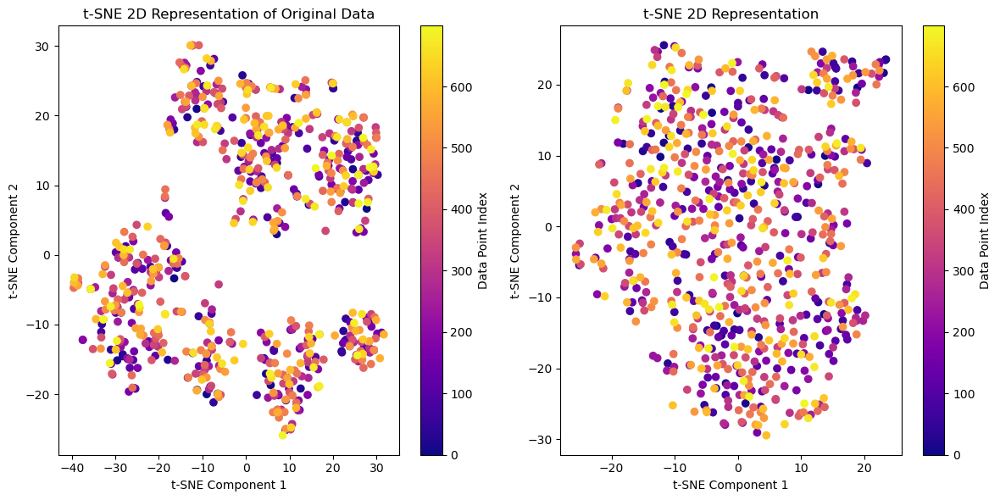

In [302]:
tab.tsne_plot(enc_val,700)

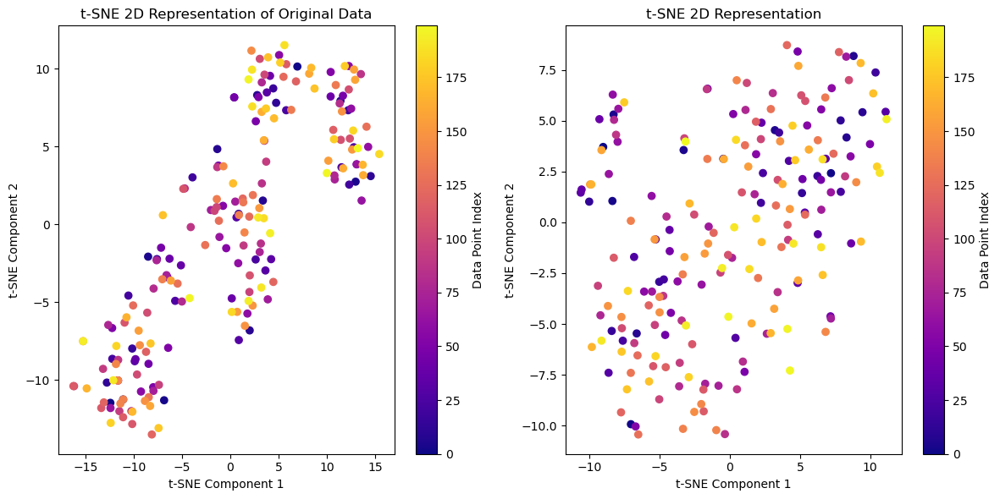

In [303]:
tab.tsne_plot(enc_val,200)

In [304]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.777093,-0.452021,0.539841,-1.320052,-0.314085,0.582993,-1.075189,0.096273,0.272831,-1.399141,...,0.648970,-1.062280,-0.280567,-0.988491,0.192889,-0.844137,0.531126,-0.040307,0.806037,-0.587483
1,0.082665,0.154885,-1.047768,-0.314883,-1.006915,-0.869699,0.250485,2.414349,-0.152406,-0.111791,...,1.828947,0.437568,-0.914905,-0.844988,-1.061375,-0.082655,2.050865,-0.610345,1.058482,-0.667905
2,-0.477219,1.249606,-0.726978,-0.623812,-1.414683,-0.651525,0.125202,-0.050071,-0.619660,-0.137227,...,1.595044,-0.411296,-1.259985,-0.520075,-0.499364,-0.060588,2.428281,0.246725,1.226985,0.218054
3,-0.560704,0.065638,-0.172748,-0.890003,-1.026785,-0.675946,-0.604605,0.177683,-0.081857,-0.529053,...,1.674932,-0.266460,-0.932557,-0.482414,-1.042796,0.184710,1.125746,0.576462,1.961837,-1.565971
4,-0.616773,-0.377987,0.219622,-1.133438,-0.415078,-0.617940,0.042728,1.454425,0.184463,-0.652643,...,-0.014645,-1.201469,-0.654218,-1.021738,-0.136845,-1.263924,1.420901,0.226244,1.134490,-0.891752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,1.005484,0.224321,-0.140973,-0.175486,-2.518602,-0.597693,0.202161,1.106577,-0.972037,-0.537536,...,2.222872,0.462328,-0.799575,0.012820,-0.770776,-0.103410,1.963677,-0.629893,0.063839,-0.051819
2915,0.157159,-0.220595,-0.495831,-0.043298,-1.266187,-0.680373,0.321087,2.394155,0.060491,-0.569115,...,1.857811,0.460751,-0.590092,0.390681,-1.385294,-0.005114,1.530589,-0.176704,0.474384,-1.035449
2916,0.127260,-0.037566,-0.472203,-1.594583,-1.266523,-0.180641,0.155086,1.665473,0.031468,-0.842077,...,1.251246,-0.110986,-0.852337,-0.429895,-1.131101,0.463509,1.640193,-0.282396,0.960389,-1.568997
2917,0.256878,0.581439,-0.159459,-0.728188,-1.742648,-0.593223,0.245181,1.358130,-0.179147,-0.170831,...,2.184711,-0.096972,-1.271829,-0.020971,-0.916943,-0.409941,0.788349,-0.605310,1.165887,-0.479638


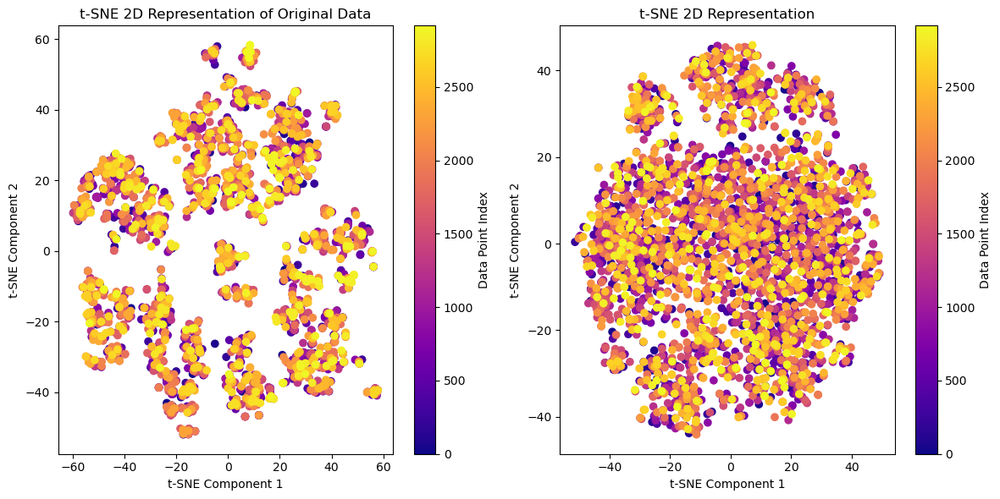

In [305]:
tab.tsne_plot(enc_val,-1)

In [306]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [307]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [308]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [309]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.777093,-0.452021,0.539841,-1.320052,-0.314085,0.582993,-1.075189,0.096273,0.272831,-1.399141,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.082665,0.154885,-1.047768,-0.314883,-1.006915,-0.869699,0.250485,2.414349,-0.152406,-0.111791,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.477219,1.249606,-0.726978,-0.623812,-1.414683,-0.651525,0.125202,-0.050071,-0.619660,-0.137227,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.560704,0.065638,-0.172748,-0.890003,-1.026785,-0.675946,-0.604605,0.177683,-0.081857,-0.529053,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-0.616773,-0.377987,0.219622,-1.133438,-0.415078,-0.617940,0.042728,1.454425,0.184463,-0.652643,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.015641,0.116570,0.443890,-1.144522,-1.581436,0.000971,-0.252032,0.425377,-0.319886,-0.095207,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.142214,-0.132049,0.190755,-1.464662,-0.017479,0.046670,-0.010132,2.637951,0.946621,-1.697820,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,1.202205,0.219250,0.822727,-0.162772,-2.129737,-0.331969,0.193854,-0.000630,-1.235366,0.035791,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.429205,0.034568,0.231791,-1.131655,-1.057215,-0.233780,0.243804,2.131124,0.197873,0.022170,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [310]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [311]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8144977298615402
mean squared error:  1081201439.4447997
rmse:  40301.14418053147
----------
Model Performance For Test Set
----------
r2_score:  0.7901990622189051
mean squared error:  1624182222.2599857
rmse:  40301.14418053147
----------
LinearRegression()
__________


In [312]:
np.log(run.get("rmse"))

10.60413513959128

In [313]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9771155891919425
mean squared error:  133381968.2532714
rmse:  33878.45208040435
----------
Model Performance For Test Set
----------
r2_score:  0.8517414355600104
mean squared error:  1147749515.364254
rmse:  33878.45208040435
----------
RandomForestRegressor()
__________


In [314]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452874863223
mean squared error:  38529076535.55617
rmse:  201416.20063374125
----------
Model Performance For Test Set
----------
r2_score:  -4.24036420597193
mean squared error:  40568485877.73151
rmse:  201416.20063374125
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568485877.7315,
 'rmse': 201416.2006}

#### Layer 2

In [315]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=2,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 52.2 s
Wall time: 32 s


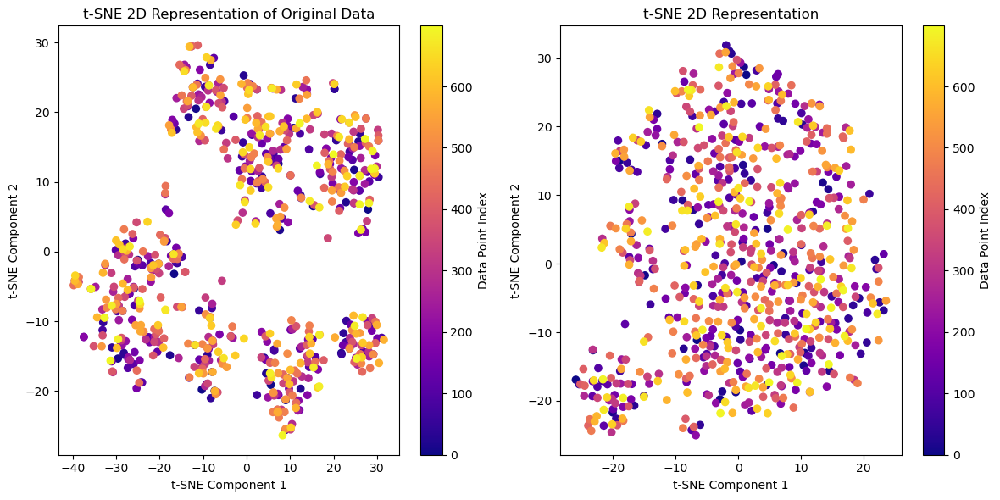

In [316]:
tab.tsne_plot(enc_val,700)

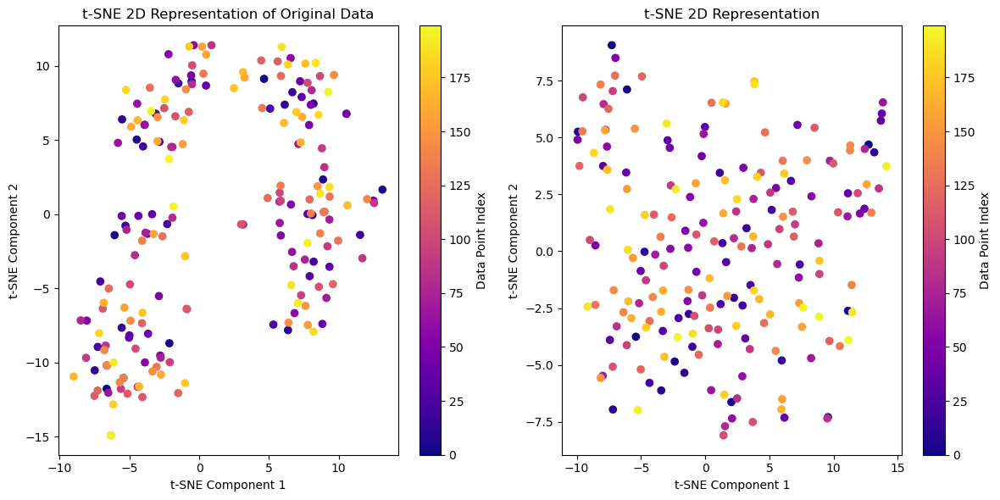

In [317]:
tab.tsne_plot(enc_val,200)

In [318]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.138830,1.120364,-1.759364,-0.260404,-0.414645,0.340926,-1.169012,-0.168215,-0.398374,-1.110316,...,-0.086340,0.691104,0.113711,0.404401,-1.910340,-1.287564,0.614161,0.197792,1.066727,0.310256
1,-0.456808,0.129955,-0.494152,0.214166,0.445886,0.559857,0.639142,0.525579,-1.661829,-0.565522,...,-1.494025,-1.107782,0.579404,0.730992,-2.366000,0.859633,1.297922,2.714370,-0.776855,0.854926
2,-0.619070,0.759015,-0.047435,-1.715789,-0.441706,0.921450,-1.180713,0.426509,-0.424419,-1.814897,...,-0.619300,-0.062011,0.155749,-0.369845,-1.414860,-0.369587,1.723330,-0.285260,0.892256,0.415058
3,-0.986843,-0.055267,-0.783134,-0.709494,1.205913,-0.243090,0.178192,0.992699,-1.356089,-1.403285,...,0.204693,-0.828573,-0.095078,1.076847,-2.065049,-0.248470,1.460456,1.244426,-0.010336,-1.224820
4,0.529468,0.245994,-1.911775,0.594447,-0.212786,0.297329,0.846001,-0.113533,-0.685364,-0.945841,...,-1.214084,0.103216,-0.470014,-0.157175,-1.556012,0.801242,1.283483,2.300547,-0.273500,0.870505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-0.535491,-0.165682,-0.818073,-0.459512,0.301169,0.700260,-0.269195,1.165182,-0.846229,-0.872927,...,-1.455567,-1.362492,-0.186442,0.589166,-2.220143,1.198940,1.637639,2.272694,-0.620071,0.965757
2915,-0.621996,-0.242513,-0.014562,-0.249168,0.770413,0.443366,0.100690,1.510226,-1.636548,-0.926928,...,-1.002528,-1.516836,0.015551,0.538428,-2.190305,0.334046,1.900237,1.959969,-0.637149,-0.127118
2916,-0.169565,0.261640,-1.256032,0.810050,0.080290,0.499140,0.049004,-0.509364,-1.652368,-1.418547,...,0.051303,-0.216708,0.446445,0.114185,-2.212830,0.465247,1.389094,1.545446,0.330632,-0.886726
2917,-1.018183,-0.154880,0.165104,-0.609145,0.613861,1.153154,-0.245389,1.488512,-1.115420,-1.687754,...,-1.651651,-0.520524,0.364944,0.723463,-2.214474,-0.069695,0.570916,0.554995,0.154050,-0.009207


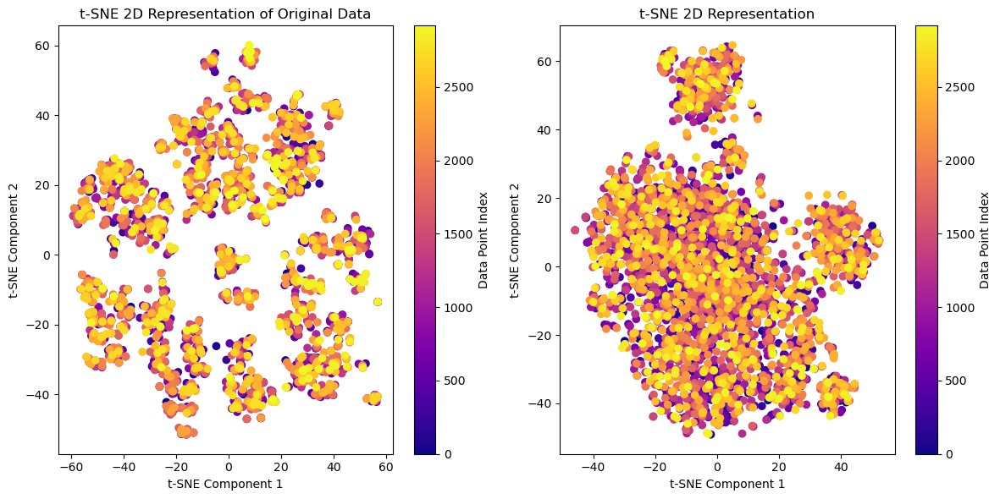

In [319]:
tab.tsne_plot(enc_val,-1)

In [320]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [321]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [322]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [323]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.138830,1.120364,-1.759364,-0.260404,-0.414645,0.340926,-1.169012,-0.168215,-0.398374,-1.110316,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-0.456808,0.129955,-0.494152,0.214166,0.445886,0.559857,0.639142,0.525579,-1.661829,-0.565522,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.619070,0.759015,-0.047435,-1.715789,-0.441706,0.921450,-1.180713,0.426509,-0.424419,-1.814897,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.986843,-0.055267,-0.783134,-0.709494,1.205913,-0.243090,0.178192,0.992699,-1.356089,-1.403285,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.529468,0.245994,-1.911775,0.594447,-0.212786,0.297329,0.846001,-0.113533,-0.685364,-0.945841,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.248635,0.019792,-0.936234,0.756918,-0.009757,0.272467,-0.678074,-1.074680,-1.253843,-1.049855,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.223080,0.999802,-1.109120,1.736891,0.024884,0.715325,0.545682,1.093783,-2.009895,-0.639021,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,0.172966,0.072066,-0.998253,-0.225228,0.321856,0.071158,0.145874,0.333098,-0.658723,-0.992132,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.247295,-0.592757,0.225730,-0.747111,1.047242,0.469161,0.420219,1.519098,-1.150081,-1.808582,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [324]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [325]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8153879888051802
mean squared error:  1076012558.1948633
rmse:  40639.43771632224
----------
Model Performance For Test Set
----------
r2_score:  0.7866620814858846
mean squared error:  1651563897.8988342
rmse:  40639.43771632224
----------
LinearRegression()
__________


In [326]:
np.log(run.get("rmse"))

10.612494246034597

In [327]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9777189205259631
mean squared error:  129865446.83109042
rmse:  31891.94840314764
----------
Model Performance For Test Set
----------
r2_score:  0.8686183299300394
mean squared error:  1017096372.9490311
rmse:  31891.94840314764
----------
RandomForestRegressor()
__________


In [328]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452649874289
mean squared error:  38529075224.20639
rmse:  201416.20292760796
----------
Model Performance For Test Set
----------
r2_score:  -4.240364325333698
mean squared error:  40568486801.775345
rmse:  201416.20292760796
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568486801.7753,
 'rmse': 201416.2029}

#### Layer 4

In [329]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=4,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 49.5 s
Wall time: 27.1 s


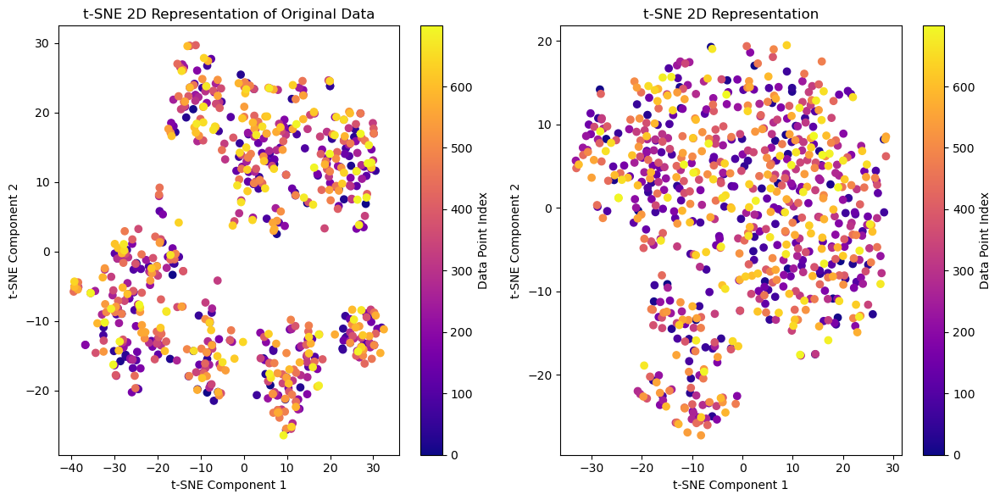

In [330]:
tab.tsne_plot(enc_val,700)

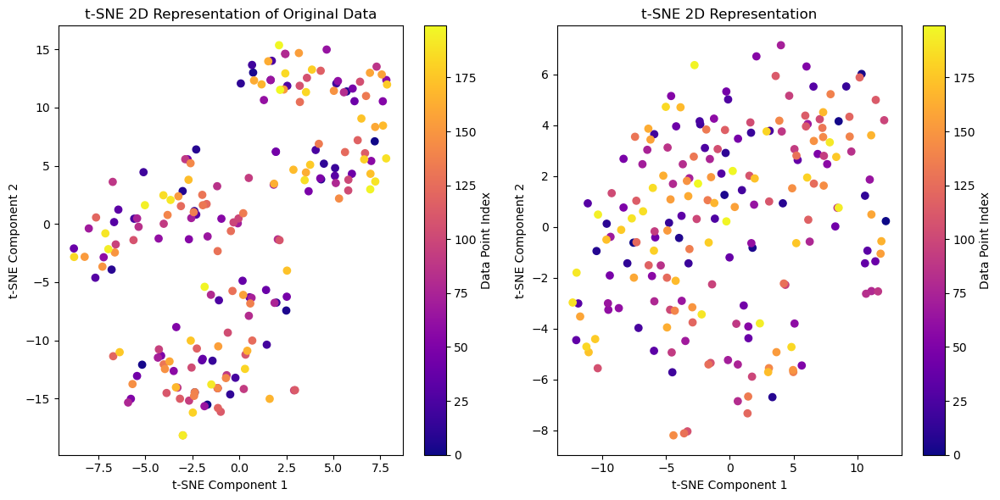

In [331]:
tab.tsne_plot(enc_val,200)

In [332]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.336278,-0.567144,-1.306771,0.160794,-1.104003,-0.373909,0.743119,0.736038,0.744436,1.829366,...,-0.247652,-0.941201,-0.266173,-0.354000,-0.133772,-0.105223,1.384080,-1.109532,0.712648,0.658858
1,-0.335671,0.762183,0.158145,1.321832,-0.355299,0.110433,-0.218837,2.291989,0.601229,0.606945,...,0.161061,-1.421708,-0.265240,-0.112556,0.634001,-0.932840,1.279377,0.141262,1.112591,1.459662
2,1.281088,1.153882,-1.693934,0.384868,-0.350532,0.309655,0.624893,0.144176,1.183599,0.875426,...,-0.150122,-0.739975,-0.924579,-0.383665,-1.293810,-0.430480,0.305690,-0.665982,1.291099,1.832058
3,1.513043,1.090548,-1.705583,-0.094023,-0.764128,-0.333221,-0.248116,-0.102184,0.850923,0.815982,...,0.080435,0.186100,-1.398977,0.801248,0.251927,0.508706,1.277710,-0.411028,-0.166554,0.574337
4,-0.480029,1.273798,-0.857190,1.248401,-0.953584,-0.061195,0.258945,1.710704,1.084595,1.554730,...,0.971004,-0.571714,-0.225338,-0.714890,-0.689789,-1.036453,0.665085,0.543437,0.274955,0.948813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.563909,-0.253648,0.380186,0.976341,-0.470577,0.074706,-0.589183,1.391409,0.469446,-0.293017,...,0.606363,-0.930675,-1.333919,0.350460,0.683592,-1.022480,1.091730,-0.052210,1.829396,2.449270
2915,-0.007966,1.134580,1.648703,0.231358,-0.920807,0.720473,-0.541609,1.013498,0.785518,0.103863,...,0.556015,-1.978281,-1.050806,0.766502,0.573397,0.040220,0.288615,0.506136,2.330503,-0.562476
2916,-0.944476,1.560371,-0.387828,0.909310,-0.637286,0.924344,0.931833,0.759758,1.447378,1.780552,...,0.631549,-1.214519,-0.907281,-0.124667,-0.165181,-0.280986,0.191198,0.501100,0.691843,-0.616749
2917,1.255840,0.771954,-1.553750,0.795869,-0.182585,0.415820,-0.186533,0.362511,-0.650650,-0.191839,...,0.297219,-0.292520,-1.046446,0.900869,0.289526,0.471601,0.733646,-1.507818,0.650664,1.452723


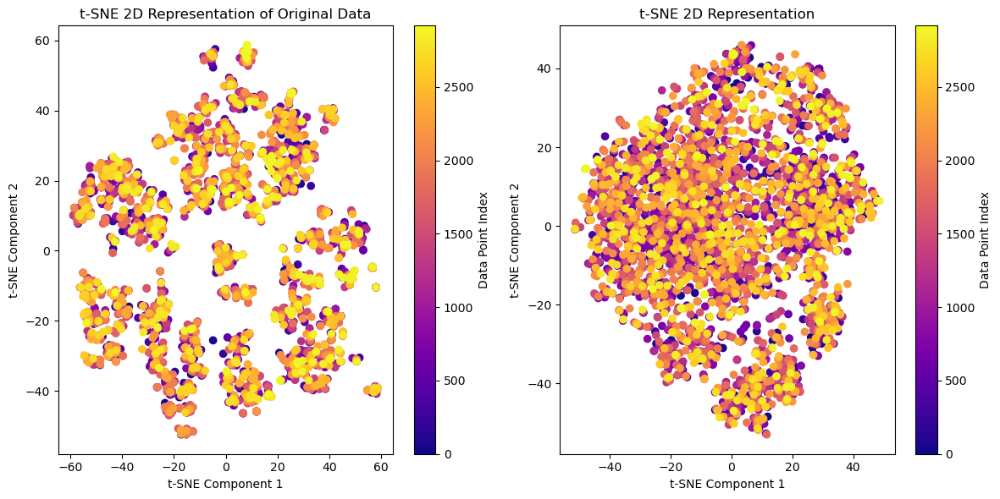

In [333]:
tab.tsne_plot(enc_val,-1)

In [334]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [335]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [336]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [337]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.336278,-0.567144,-1.306771,0.160794,-1.104003,-0.373909,0.743119,0.736038,0.744436,1.829366,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-0.335671,0.762183,0.158145,1.321832,-0.355299,0.110433,-0.218837,2.291989,0.601229,0.606945,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,1.281088,1.153882,-1.693934,0.384868,-0.350532,0.309655,0.624893,0.144176,1.183599,0.875426,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,1.513043,1.090548,-1.705583,-0.094023,-0.764128,-0.333221,-0.248116,-0.102184,0.850923,0.815982,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-0.480029,1.273798,-0.857190,1.248401,-0.953584,-0.061195,0.258945,1.710704,1.084595,1.554730,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-1.597191,0.975357,-0.672648,1.204009,-0.422224,-0.496184,0.497387,1.273653,0.711156,1.481469,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-1.021067,0.549979,-0.621940,1.597878,-1.283632,-0.337261,0.326795,2.169828,0.407131,1.041596,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-0.540894,2.134598,-0.462051,1.129559,-0.537932,1.543790,-0.488841,-0.062684,0.617758,1.024133,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.596418,-0.014549,0.919310,0.634017,-0.605545,-0.545407,-0.378197,2.705936,0.874146,-0.273671,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [338]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [339]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8139886622025638
mean squared error:  1084168544.2961273
rmse:  40953.41754751727
----------
Model Performance For Test Set
----------
r2_score:  0.7833528545146591
mean squared error:  1677182408.821295
rmse:  40953.41754751727
----------
LinearRegression()
__________


In [340]:
np.log(run.get("rmse"))

10.62019054123246

In [341]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9745918544486821
mean squared error:  148091576.03949085
rmse:  36027.11702646337
----------
Model Performance For Test Set
----------
r2_score:  0.8323391386190275
mean squared error:  1297953161.238487
rmse:  36027.11702646337
----------
RandomForestRegressor()
__________


In [342]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610456006890668
mean squared error:  38529094790.60274
rmse:  201416.23740078756
----------
Model Performance For Test Set
----------
r2_score:  -4.2403661191520055
mean squared error:  40568500688.690414
rmse:  201416.23740078756
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568500688.6904,
 'rmse': 201416.2374}

#### Layer 8

In [343]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 49.8 s
Wall time: 26.9 s


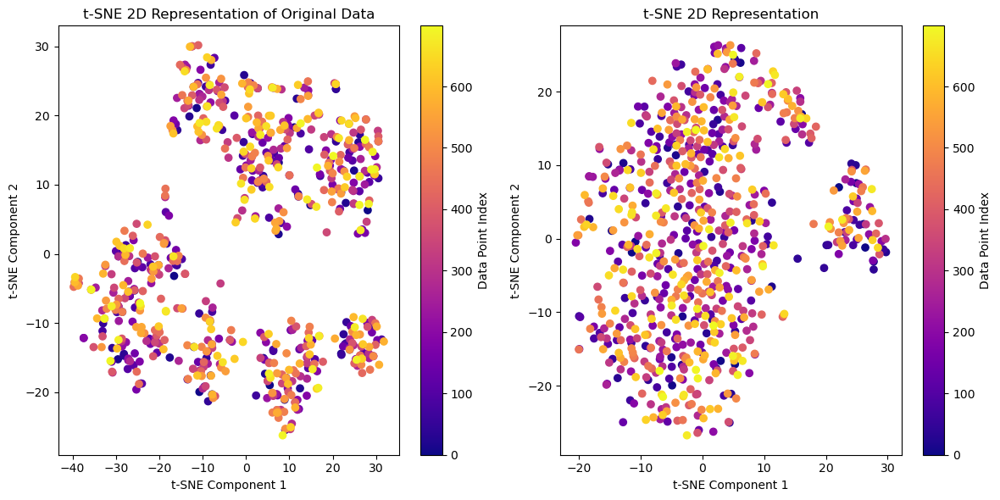

In [344]:
tab.tsne_plot(enc_val,700)

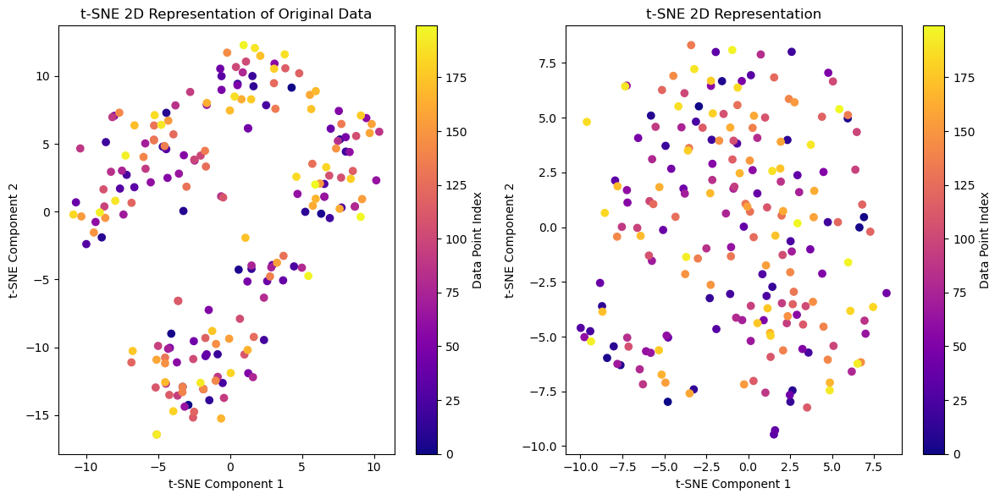

In [345]:
tab.tsne_plot(enc_val,200)

In [346]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


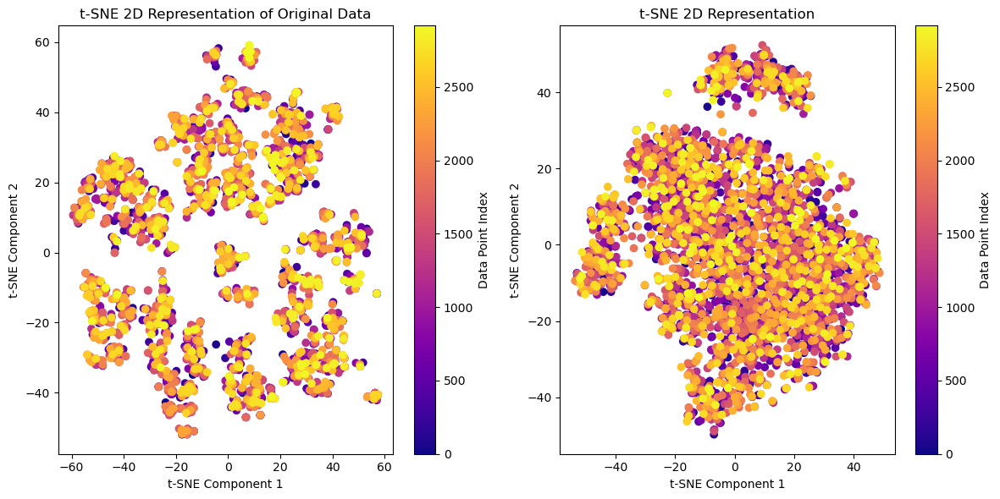

In [347]:
tab.tsne_plot(enc_val,-1)

In [348]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [349]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [350]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [351]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [352]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [353]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8174435731318483
mean squared error:  1064031568.7911494
rmse:  39125.264500239056
----------
Model Performance For Test Set
----------
r2_score:  0.8022633165532261
mean squared error:  1530786322.2136664
rmse:  39125.264500239056
----------
LinearRegression()
__________


In [354]:
np.log(run.get("rmse"))

10.574523688202989

In [355]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.97719907588854
mean squared error:  132895365.38599497
rmse:  31593.00658906003
----------
Model Performance For Test Set
----------
r2_score:  0.8710698200892468
mean squared error:  998118065.3363905
rmse:  31593.00658906003
----------
RandomForestRegressor()
__________


In [356]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453985639149
mean squared error:  38529083009.722374
rmse:  201416.21143125632
----------
Model Performance For Test Set
----------
r2_score:  -4.2403647678225935
mean squared error:  40568490227.32055
rmse:  201416.21143125632
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568490227.3206,
 'rmse': 201416.2114}

In [357]:
run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8174435731318483
mean squared error:  1064031568.7911494
rmse:  39125.264500239056
----------
Model Performance For Test Set
----------
r2_score:  0.8022633165532261
mean squared error:  1530786322.2136664
rmse:  39125.264500239056
----------
LinearRegression()
__________


{'Model Name': 'LinearRegression()',
 'r2_score': 0.8023,
 'mean squared error': 1530786322.2137,
 'rmse': 39125.2645}

In [358]:
# from sklearn.model_selection import train_test_split
# X_train,X_test, y_train,y_test = train_test_split(train,target,test_size=0.25,random_state=24)

#### Layer 12

In [359]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=12,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 51.2 s
Wall time: 27.7 s


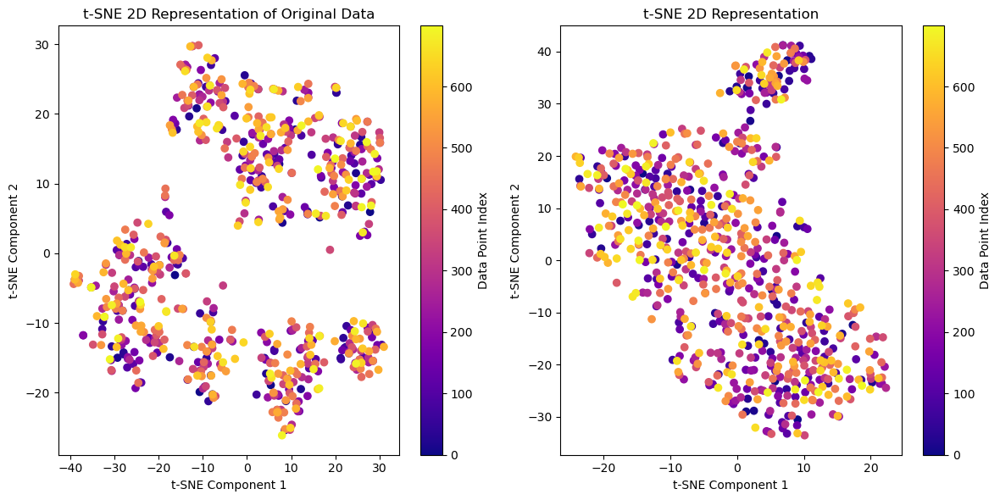

In [360]:
tab.tsne_plot(enc_val,700)

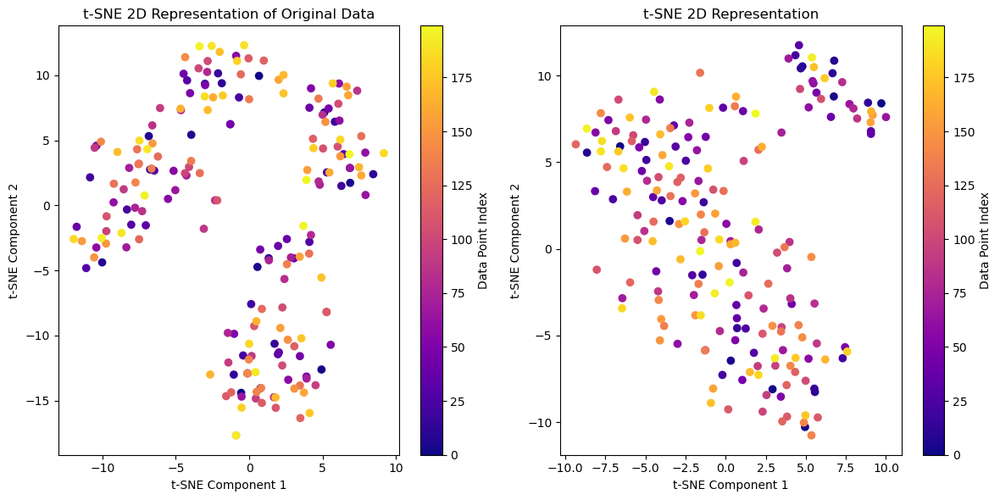

In [361]:
tab.tsne_plot(enc_val,200)

In [362]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.869475,0.871392,0.298507,1.664856,-0.193914,-0.104278,-0.952854,-0.497973,-0.722649,0.249235,...,0.700271,-0.875742,-1.429821,-0.840329,-0.465278,0.041852,1.244658,-1.181093,0.675696,0.359343
1,0.207252,-0.305349,0.420697,-1.153618,0.442286,-1.038495,-1.184399,3.203655,-0.755680,-0.661136,...,0.378186,-1.885107,1.054840,-0.113320,-0.018562,-0.256652,0.104329,-0.694649,0.803305,0.309087
2,-0.788044,0.708274,-0.922498,-0.688909,-0.352767,-2.223808,0.182717,0.043063,-1.261474,-0.575255,...,0.375571,-1.107912,-0.032024,-0.362682,0.994432,0.409266,1.380463,-0.428124,1.123566,0.614482
3,-1.289668,0.026901,-0.837787,-1.510503,0.234368,-1.621017,-0.373281,-0.298362,0.042874,-0.565289,...,0.783791,-2.027195,0.929766,1.378429,1.071077,1.050812,1.297469,-0.432558,0.475691,0.264286
4,0.388878,0.484109,-0.407637,0.443903,-0.070834,-0.469688,-2.062876,1.503933,0.084646,-0.255190,...,1.309493,-0.360140,-0.593371,-1.427512,-0.159414,-0.209295,0.563831,-1.828228,1.145469,0.543626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-0.291291,-0.086384,0.695718,-1.120783,0.266087,-1.848982,-1.814082,2.118246,-0.877320,-0.586908,...,0.070425,-1.543464,1.007032,-0.406700,0.300697,-0.547281,-0.068250,-0.317089,1.859638,0.833625
2915,0.020006,-0.603476,0.162290,-1.376004,0.194196,-0.839796,-1.838438,2.446287,-0.416834,-0.151265,...,1.108668,-2.193989,1.512466,-0.073128,0.320785,-0.610532,-0.916917,-0.455951,0.827358,-0.733738
2916,-0.335265,-0.212948,-0.054981,-1.187910,0.490403,-0.760092,-0.666369,2.013627,0.479596,-0.505977,...,0.363444,-2.318783,0.884338,-0.811265,1.016361,0.039313,0.574033,-1.590192,0.176045,0.395755
2917,-0.810845,0.144948,0.322390,-1.432435,0.244709,-1.353185,-0.702646,1.325388,-0.590096,-0.390236,...,0.845465,-2.656377,0.347177,0.512426,1.243115,-0.201091,0.157995,-0.610243,1.790604,0.935240


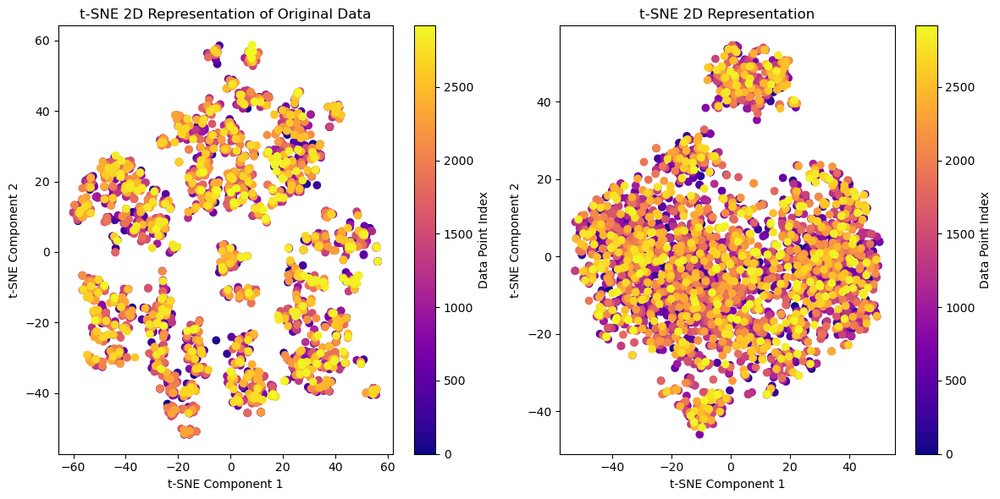

In [363]:
tab.tsne_plot(enc_val,-1)

In [364]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [365]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [366]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [367]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.869475,0.871392,0.298507,1.664856,-0.193914,-0.104278,-0.952854,-0.497973,-0.722649,0.249235,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.207252,-0.305349,0.420697,-1.153618,0.442286,-1.038495,-1.184399,3.203655,-0.755680,-0.661136,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.788044,0.708274,-0.922498,-0.688909,-0.352767,-2.223808,0.182717,0.043063,-1.261474,-0.575255,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-1.289668,0.026901,-0.837787,-1.510503,0.234368,-1.621017,-0.373281,-0.298362,0.042874,-0.565289,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.388878,0.484109,-0.407637,0.443903,-0.070834,-0.469688,-2.062876,1.503933,0.084646,-0.255190,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.954630,0.728041,-1.205946,0.328450,-0.259927,-0.487291,-1.078151,0.508453,-0.160394,0.631724,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.735387,0.947248,0.522988,1.045580,-0.271667,0.325608,-1.331820,1.448369,-1.177725,-0.390619,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-1.073674,0.133795,0.667654,-2.027814,0.029349,-1.267361,-0.816718,0.521446,-0.044645,-0.375901,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.847818,1.097951,-0.010890,-0.065969,0.289915,-0.313435,-1.032991,1.391038,-0.429000,-0.224609,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [368]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [369]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8169835039989818
mean squared error:  1066713085.3479447
rmse:  40176.50920229622
----------
Model Performance For Test Set
----------
r2_score:  0.7914947128747454
mean squared error:  1614151891.682193
rmse:  40176.50920229622
----------
LinearRegression()
__________


In [370]:
np.log(run.get("rmse"))

10.601037755550422

In [371]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9770756938373646
mean squared error:  133614498.64098378
rmse:  34952.1259028519
----------
Model Performance For Test Set
----------
r2_score:  0.842195325139873
mean squared error:  1221651105.1288106
rmse:  34952.1259028519
----------
RandomForestRegressor()
__________


In [372]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453976652302
mean squared error:  38529082957.34247
rmse:  201416.17882833598
----------
Model Performance For Test Set
----------
r2_score:  -4.240363071323785
mean squared error:  40568477093.80822
rmse:  201416.17882833598
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568477093.8082,
 'rmse': 201416.1788}

#### Layer 50

In [373]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=50,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 49.4 s
Wall time: 26.8 s


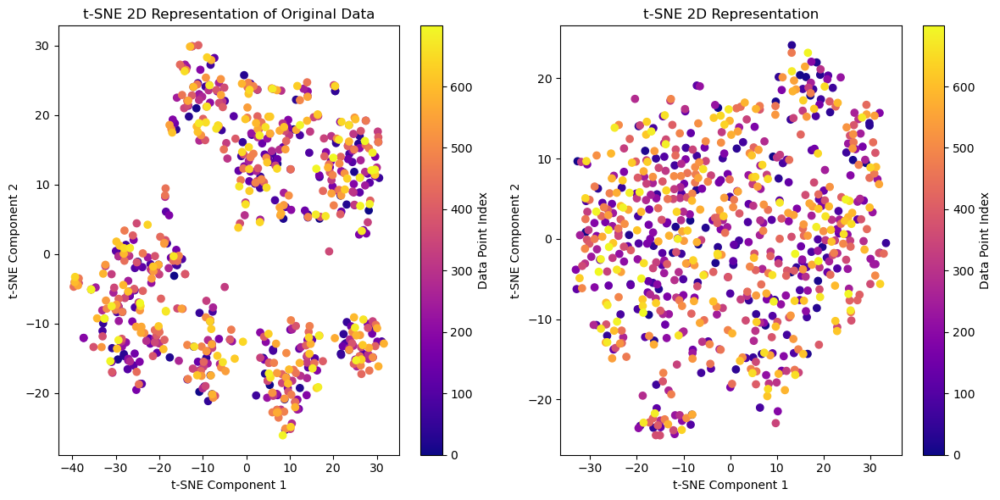

In [374]:
tab.tsne_plot(enc_val,700)

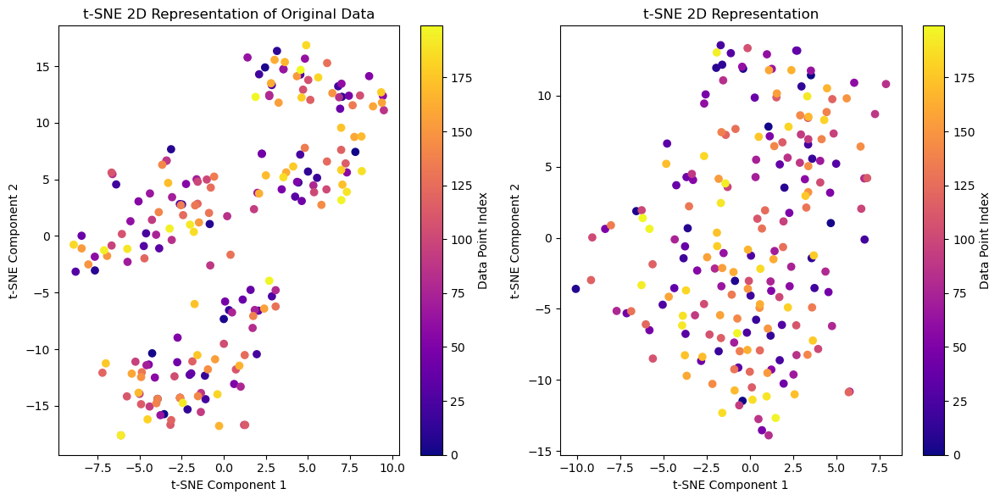

In [375]:
tab.tsne_plot(enc_val,200)

In [376]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.366762,-1.306907,-0.013498,-0.630929,-1.257609,0.377457,-1.329669,0.218997,0.749486,0.233102,...,-0.048739,-0.226473,-0.130789,-0.760162,0.787592,-1.270164,1.398894,0.540949,1.068978,0.095978
1,-2.290053,-0.557281,0.637009,1.344020,-0.620551,-1.130371,-0.098948,2.361322,-0.085782,-0.457366,...,0.765024,0.421367,0.111125,0.741772,-0.642586,0.052418,0.621979,-0.439584,0.866279,-0.053345
2,0.337495,0.543291,0.173976,-0.220389,-0.701143,0.164158,-1.370829,1.048921,0.184518,-0.787554,...,0.482451,-0.853838,-0.933825,-0.490566,0.706995,-0.374494,0.457231,-0.556076,1.726059,-0.415408
3,-0.066289,0.442581,0.429514,-1.057702,0.152473,-1.226956,-0.328582,1.827302,0.396876,0.190244,...,0.098877,-0.842905,-0.062896,0.654170,0.260207,-0.204112,-0.470189,0.360645,1.257694,-1.172382
4,-0.474285,-1.280009,-0.966980,-0.585078,-1.246563,-0.100716,-0.111746,2.151621,-0.124985,-0.006539,...,0.618845,-0.477698,0.233619,0.427151,-0.142913,-1.211246,1.121354,-0.420359,1.736246,-0.553605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-1.044869,-1.185191,0.812365,-0.071597,-0.896448,-1.203280,-0.847317,1.536433,0.289469,-0.427278,...,1.036045,0.092930,-0.307363,0.896937,-0.331188,0.261765,-0.456636,0.068899,2.019266,0.380420
2915,-0.218808,-0.710968,0.562992,0.144002,-0.559646,-1.495953,-0.397517,2.175454,0.149315,0.312932,...,0.131377,0.193292,-1.265452,1.516697,-0.779442,0.489856,-0.181724,-0.067856,1.548998,-0.583956
2916,-0.712654,-0.158896,1.169019,-1.361427,0.268024,-0.653996,-0.083293,2.229920,-0.113050,-0.020743,...,0.148517,0.116740,-1.456411,0.491368,-0.411426,0.032440,0.164717,0.189071,0.800879,-0.664788
2917,-0.423448,0.261109,0.662913,-0.527827,-0.666024,-0.462344,-1.465556,1.893532,0.029021,0.003018,...,0.381372,-0.687411,-1.418658,0.454123,0.864424,-0.073107,0.515653,0.015517,1.468057,-0.474467


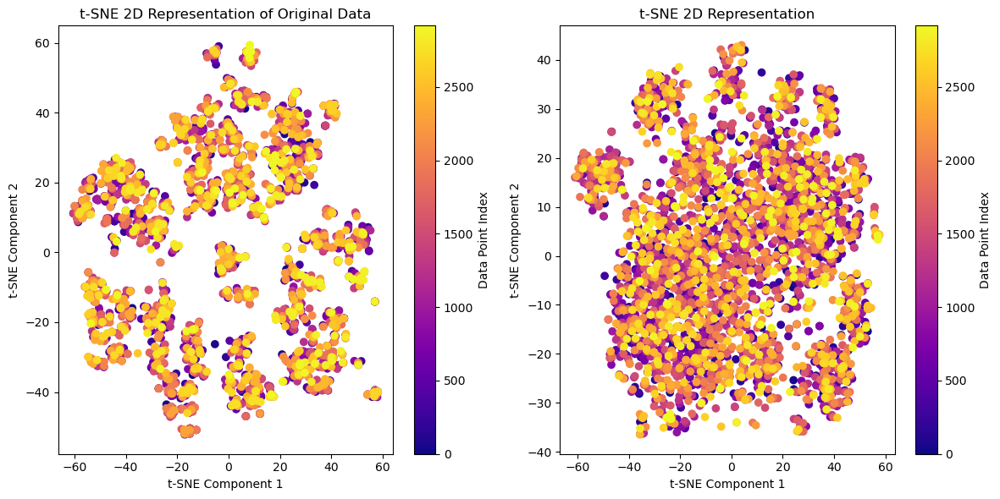

In [377]:
tab.tsne_plot(enc_val,-1)

In [378]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [379]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [380]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [381]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.366762,-1.306907,-0.013498,-0.630929,-1.257609,0.377457,-1.329669,0.218997,0.749486,0.233102,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-2.290053,-0.557281,0.637009,1.344020,-0.620551,-1.130371,-0.098948,2.361322,-0.085782,-0.457366,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,0.337495,0.543291,0.173976,-0.220389,-0.701143,0.164158,-1.370829,1.048921,0.184518,-0.787554,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.066289,0.442581,0.429514,-1.057702,0.152473,-1.226956,-0.328582,1.827302,0.396876,0.190244,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-0.474285,-1.280009,-0.966980,-0.585078,-1.246563,-0.100716,-0.111746,2.151621,-0.124985,-0.006539,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.048850,-0.770996,-0.072565,-0.518075,-1.487986,-0.174347,-0.838489,1.331609,0.510679,-0.170089,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-1.391116,-1.326592,-0.033789,-0.383884,-1.484489,-0.240973,-1.050701,2.637621,0.109444,0.257349,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,0.351667,-0.604099,0.442016,-1.161385,-1.565099,-0.481294,-1.275653,0.800911,0.428142,-0.981654,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.625798,-0.510858,-0.080168,-0.652046,-0.784990,0.003271,-0.345676,2.289140,0.057423,-0.669817,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [382]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [383]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.813949617437437
mean squared error:  1084396117.0165381
rmse:  40867.313809120846
----------
Model Performance For Test Set
----------
r2_score:  0.7842628893927756
mean squared error:  1670137337.9731593
rmse:  40867.313809120846
----------
LinearRegression()
__________


In [384]:
np.log(run.get("rmse"))

10.618085848927304

In [385]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9773660676065552
mean squared error:  131922052.84508342
rmse:  34044.27358460211
----------
Model Performance For Test Set
----------
r2_score:  0.8502865506872621
mean squared error:  1159012563.903237
rmse:  34044.27358460211
----------
RandomForestRegressor()
__________


In [386]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452498592041
mean squared error:  38529074342.45662
rmse:  201416.18403853892
----------
Model Performance For Test Set
----------
r2_score:  -4.240363342437611
mean squared error:  40568479192.646576
rmse:  201416.18403853892
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568479192.6466,
 'rmse': 201416.184}

#### Layer 100

In [387]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=100,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 50.6 s
Wall time: 27.4 s


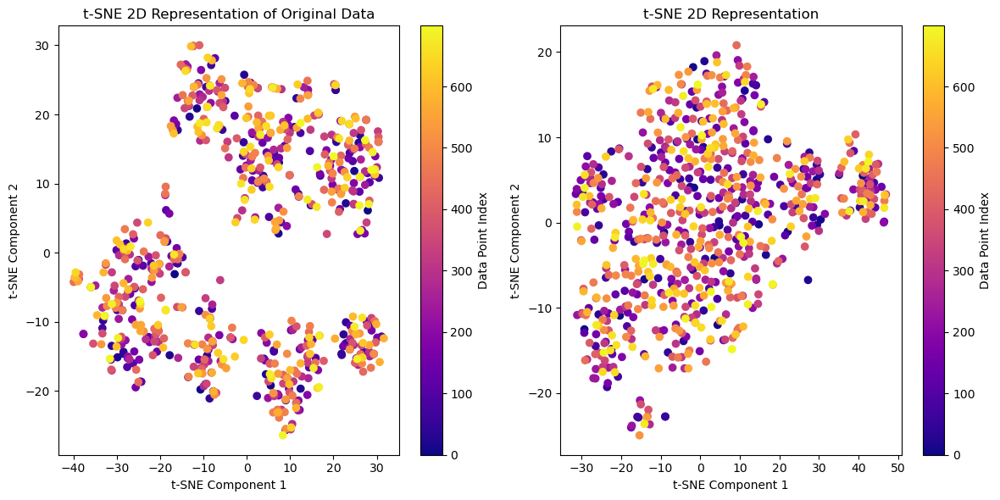

In [388]:
tab.tsne_plot(enc_val,700)

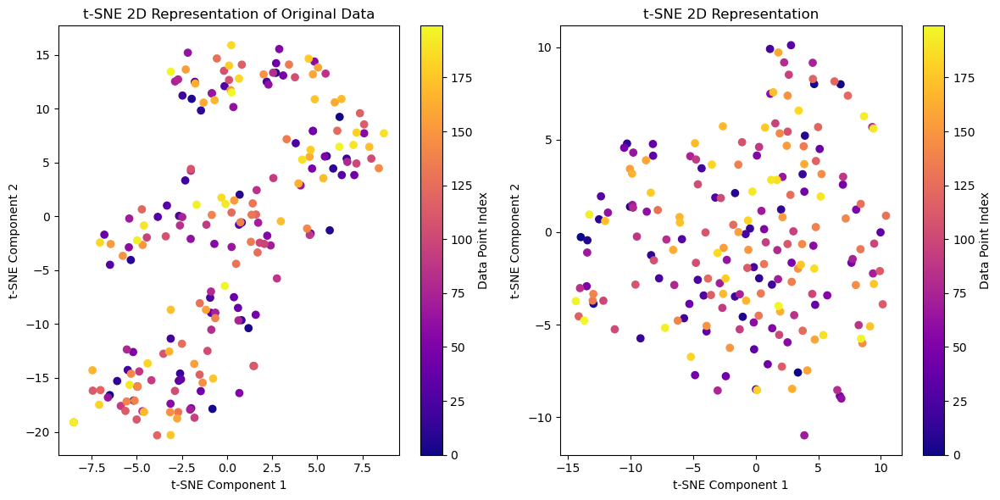

In [389]:
tab.tsne_plot(enc_val,200)

In [390]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.569924,-0.756680,-0.713499,-1.372700,0.950006,-0.014172,-0.230667,-0.016446,-0.373130,0.770324,...,-0.422626,-0.083420,-0.441077,-0.548863,0.532757,0.679299,1.090564,-0.404960,1.622902,0.538932
1,1.887330,-0.389225,1.458565,-0.595657,0.022916,-0.117310,0.306183,1.008407,0.215159,0.802859,...,-0.393096,-0.990243,-2.186695,-0.891166,0.023783,0.445695,0.791200,-0.553126,1.765466,-0.716910
2,0.628539,-1.933435,0.146826,0.350524,-0.961018,0.360948,0.055848,0.939347,0.997953,0.475083,...,0.538407,-0.199275,-0.390160,-1.642973,-0.550090,1.077675,-0.499522,-0.741309,0.343022,0.699542
3,1.554893,-1.551448,0.523674,-0.091209,-0.702348,-0.082425,-0.613071,0.565816,0.915687,1.390112,...,0.802134,-0.711104,-0.110275,-1.133038,0.116264,0.858978,0.276292,-1.093432,0.636672,0.459874
4,1.883852,-0.165326,0.265281,-1.203531,1.379416,-0.540480,0.043732,1.460390,0.113460,0.853997,...,-1.111146,0.015795,-0.591880,-1.907714,0.621619,1.038246,0.344970,-1.398232,0.760882,-0.436916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,2.310528,-0.102659,0.981586,-0.028588,-0.847225,-0.094500,-0.160999,1.101069,0.081732,0.994001,...,0.449885,-1.194064,-1.525995,-1.393632,0.132653,0.526876,0.247068,-0.317294,1.357560,-0.365961
2915,1.339653,-1.887231,-0.289264,0.913847,-1.150399,-1.184261,0.480615,1.921418,0.290355,0.671438,...,0.283052,-1.295494,-1.317006,-0.842011,0.223664,-0.181012,0.586949,0.180516,1.797623,-0.202477
2916,1.894014,-1.036634,1.123745,-0.532481,-0.158139,0.198647,-0.136686,0.811141,0.455143,1.415767,...,-0.227018,-0.895667,-1.245473,-1.426115,0.060350,0.478480,0.955877,-0.564728,1.504731,-0.665071
2917,1.845757,-1.239781,0.332271,-0.355031,-0.890044,0.427740,-1.340541,0.956815,-0.068633,0.988976,...,0.529257,-0.861197,-0.191623,-0.955249,0.001930,0.940506,0.085600,-0.733757,0.633083,0.728513


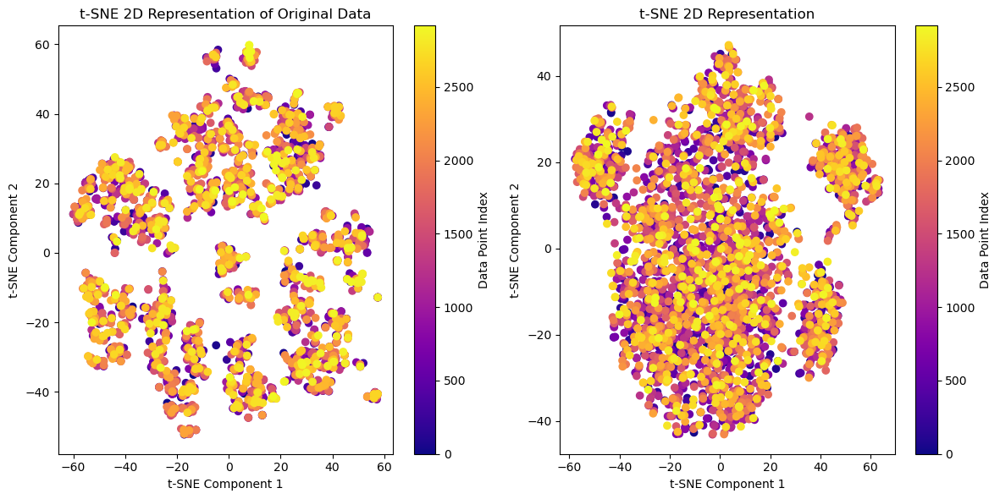

In [391]:
tab.tsne_plot(enc_val,-1)

In [392]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [393]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [394]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [395]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.569924,-0.756680,-0.713499,-1.372700,0.950006,-0.014172,-0.230667,-0.016446,-0.373130,0.770324,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,1.887330,-0.389225,1.458565,-0.595657,0.022916,-0.117310,0.306183,1.008407,0.215159,0.802859,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,0.628539,-1.933435,0.146826,0.350524,-0.961018,0.360948,0.055848,0.939347,0.997953,0.475083,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,1.554893,-1.551448,0.523674,-0.091209,-0.702348,-0.082425,-0.613071,0.565816,0.915687,1.390112,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,1.883852,-0.165326,0.265281,-1.203531,1.379416,-0.540480,0.043732,1.460390,0.113460,0.853997,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.518608,-0.399519,0.687991,-0.980377,0.743596,-0.099561,-0.577150,0.668719,0.254763,0.995209,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.993078,-1.398642,-0.607201,-1.035809,0.996304,0.210663,0.179777,1.146554,-0.122136,0.676110,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,1.039935,-1.024276,1.199551,-0.471660,-0.475528,0.609416,0.431630,0.886645,0.491982,-0.324087,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.110343,-1.354248,0.252830,-1.028378,-0.098517,1.004421,-1.826691,1.553618,-1.028395,0.556780,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [396]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [397]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8157108297827808
mean squared error:  1074130877.0195708
rmse:  40307.033042473355
----------
Model Performance For Test Set
----------
r2_score:  0.7901377449015583
mean squared error:  1624656912.687039
rmse:  40307.033042473355
----------
LinearRegression()
__________


In [398]:
np.log(run.get("rmse"))

10.604281248837639

In [399]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9759968667092167
mean squared error:  139902451.0363646
rmse:  33483.55197963921
----------
Model Performance For Test Set
----------
r2_score:  0.855177607731676
mean squared error:  1121148253.173201
rmse:  33483.55197963921
----------
RandomForestRegressor()
__________


In [400]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453832811356
mean squared error:  38529082118.964386
rmse:  201416.17547468553
----------
Model Performance For Test Set
----------
r2_score:  -4.240362896815999
mean squared error:  40568475742.84931
rmse:  201416.17547468553
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568475742.8493,
 'rmse': 201416.1755}

In [401]:
run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8157108297827808
mean squared error:  1074130877.0195708
rmse:  40307.033042473355
----------
Model Performance For Test Set
----------
r2_score:  0.7901377449015583
mean squared error:  1624656912.687039
rmse:  40307.033042473355
----------
LinearRegression()
__________


{'Model Name': 'LinearRegression()',
 'r2_score': 0.7901,
 'mean squared error': 1624656912.687,
 'rmse': 40307.033}

### Scale the numerical values `min_max_scaling`, `z_score_scaling`, `robust_scaling`.

#### Encoding before scaling

In [13]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 45.5 s
Wall time: 24.4 s


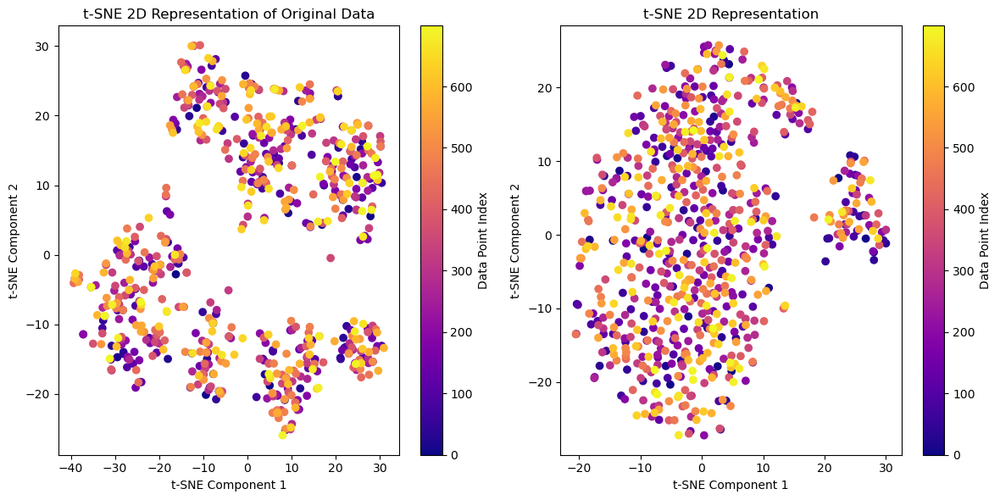

In [14]:
tab.tsne_plot(enc_val,700)

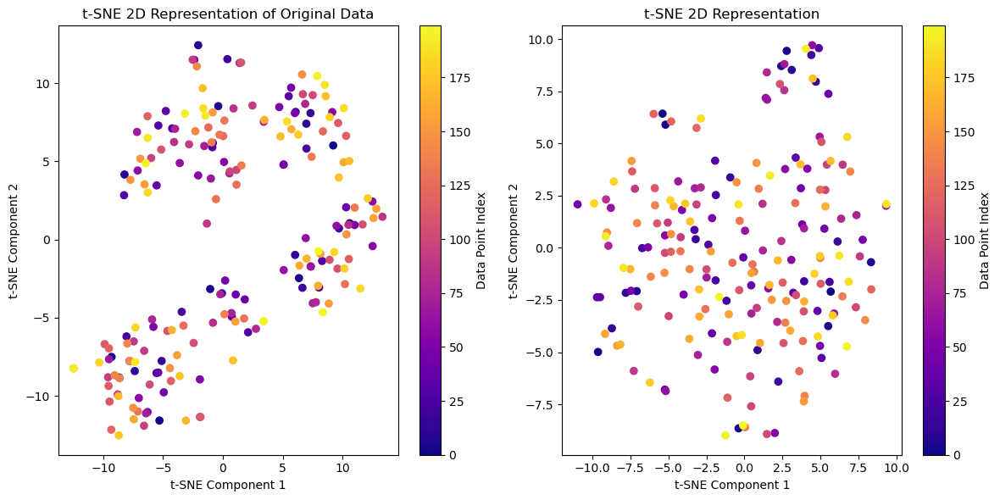

In [15]:
tab.tsne_plot(enc_val,200)

In [16]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


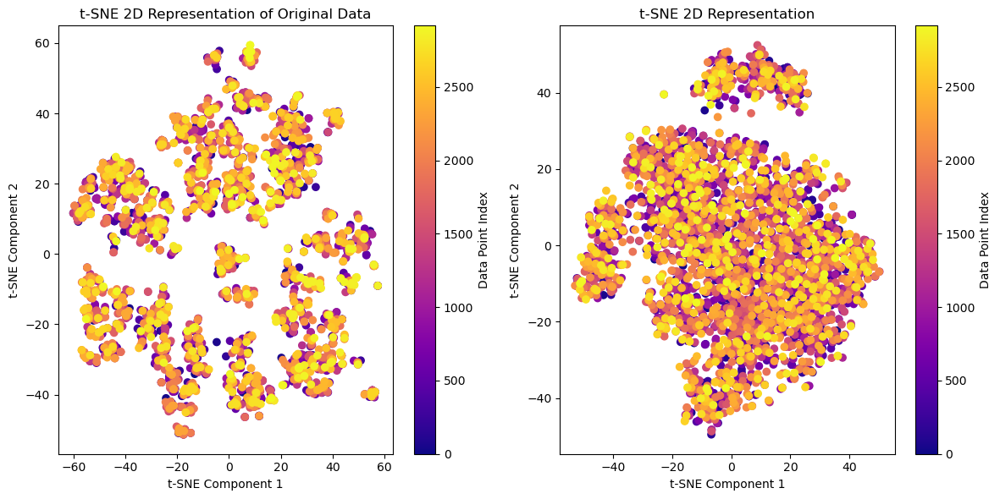

In [17]:
tab.tsne_plot(enc_val,-1)

#### min_max_scaling

In [409]:
scale = Scaling.min_max_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [18]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [411]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [412]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,0.50,0.195481,0.428571,0.043796
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.000000,0.0,0.0,0.0,0.000000,0.363636,0.25,0.191802,0.285714,0.233577
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.000000,0.0,0.0,0.0,0.000000,0.727273,0.50,0.207742,0.428571,0.058394
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.268775,0.0,0.0,0.0,0.000000,0.090909,0.00,0.187336,0.142857,0.671533
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.50,0.263531,0.428571,0.065693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,0.000000,0.0,0.0,0.0,0.000000,0.636364,0.25,0.198459,0.285714,0.065693
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,1.00,0.287353,0.285714,0.240876
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,0.000000,0.0,0.0,0.0,0.147059,0.363636,1.00,0.276581,0.142857,0.510949
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,0.110672,0.0,0.0,0.0,0.000000,0.272727,1.00,0.159573,0.142857,0.445255


In [413]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [414]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8175416834444097
mean squared error:  1063459732.0632937
rmse:  39521.89848808403
----------
Model Performance For Test Set
----------
r2_score:  0.7982338675833769
mean squared error:  1561980460.1024187
rmse:  39521.89848808403
----------
LinearRegression()
__________


In [415]:
np.log(run.get("rmse"))

10.584610189675582

In [416]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9777713024960708
mean squared error:  129560138.10662502
rmse:  32082.665337895996
----------
Model Performance For Test Set
----------
r2_score:  0.8670422813391845
mean squared error:  1029297415.1834332
rmse:  32082.665337895996
----------
RandomForestRegressor()
__________


In [417]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452903787346
mean squared error:  38529076704.14064
rmse:  201416.21049269685
----------
Model Performance For Test Set
----------
r2_score:  -4.240364718984478
mean squared error:  40568489849.23836
rmse:  201416.21049269685
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568489849.2384,
 'rmse': 201416.2105}

#### z_score_scaling 

In [418]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [419]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [420]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [421]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [422]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [423]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8174435731318483
mean squared error:  1064031568.7911494
rmse:  39125.264500239056
----------
Model Performance For Test Set
----------
r2_score:  0.8022633165532261
mean squared error:  1530786322.2136664
rmse:  39125.264500239056
----------
LinearRegression()
__________


In [424]:
np.log(run.get("rmse"))

10.574523688202989

In [425]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9767796881099644
mean squared error:  135339770.3495735
rmse:  33484.6480473449
----------
Model Performance For Test Set
----------
r2_score:  0.8551681261960622
mean squared error:  1121221654.8545585
rmse:  33484.6480473449
----------
RandomForestRegressor()
__________


In [426]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610454686499152
mean squared error:  38529087094.690414
rmse:  201416.21450720137
----------
Model Performance For Test Set
----------
r2_score:  -4.24036492787996
mean squared error:  40568491466.41096
rmse:  201416.21450720137
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568491466.411,
 'rmse': 201416.2145}

#### Robust Scaling

In [18]:
from sklearn.preprocessing import RobustScaler

In [19]:
rs = RobustScaler()

In [20]:
def robust_scaling(data):
    data = np.array(data)
    data = data.reshape(1,-1)
    scaled_data = rs.fit_transform(data)

    return scaled_data

In [21]:
scale = Scaling.robust_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [22]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [23]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [24]:
missing=train.isnull().sum().sort_values(ascending=False)
missing=missing.drop(missing[missing==0].index)
df = pd.DataFrame(missing)
train.drop(df.T.columns,inplace=True,axis=1)
# train_df.drop("Id",inplace=True,axis=1)
train.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.0,0.0,0.0,0.0,0.0,-0.4,0.0,0.509062,0.2,-3.0
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.0,0.0,0.0,0.0,0.0,-0.1,-0.1,0.324747,0.1,-0.4
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.0,0.0,0.0,0.0,0.0,0.3,0.0,1.123448,0.2,-2.8
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,27.2,0.0,0.0,0.0,0.0,-0.4,-0.2,0.100935,0.0,5.6
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.0,0.0,0.0,0.0,0.0,0.6,0.0,3.918901,0.2,-2.7


In [25]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 63 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSZoning       1460 non-null   float32
 1   Street         1460 non-null   float32
 2   LotShape       1460 non-null   float32
 3   LandContour    1460 non-null   float32
 4   Utilities      1460 non-null   float32
 5   LotConfig      1460 non-null   float32
 6   LandSlope      1460 non-null   float32
 7   Neighborhood   1460 non-null   float32
 8   Condition1     1460 non-null   float32
 9   Condition2     1460 non-null   float32
 10  BldgType       1460 non-null   float32
 11  HouseStyle     1460 non-null   float32
 12  RoofStyle      1460 non-null   float32
 13  RoofMatl       1460 non-null   float32
 14  Exterior1st    1460 non-null   float32
 15  Exterior2nd    1460 non-null   float32
 16  ExterQual      1460 non-null   float32
 17  ExterCond      1460 non-null   float32
 18  Foundati

In [26]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.817541683444993
mean squared error:  1063459732.0598941
rmse:  39521.89849647178
----------
Model Performance For Test Set
----------
r2_score:  0.7982338674977351
mean squared error:  1561980460.7654183
rmse:  39521.89849647178
----------
LinearRegression()
__________


In [27]:
np.log(run.get("rmse"))

10.584610189675582

In [28]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9778112885220981
mean squared error:  129327079.2396573
rmse:  33128.76918243428
----------
Model Performance For Test Set
----------
r2_score:  0.8582303475632989
mean squared error:  1097515347.5430071
rmse:  33128.76918243428
----------
RandomForestRegressor()
__________


In [29]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453780920916
mean squared error:  38529081816.520546
rmse:  201416.2443896541
----------
Model Performance For Test Set
----------
r2_score:  -4.240366482819014
mean squared error:  40568503504.032875
rmse:  201416.2443896541
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568503504.0329,
 'rmse': 201416.2444}

### Dropout in Encoder `0.2`, `0.4`, `0.8`.

#### Encoding with 0.2 dropout

In [30]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.2)
enc_val = tab.encode()

CPU times: total: 50 s
Wall time: 27.4 s


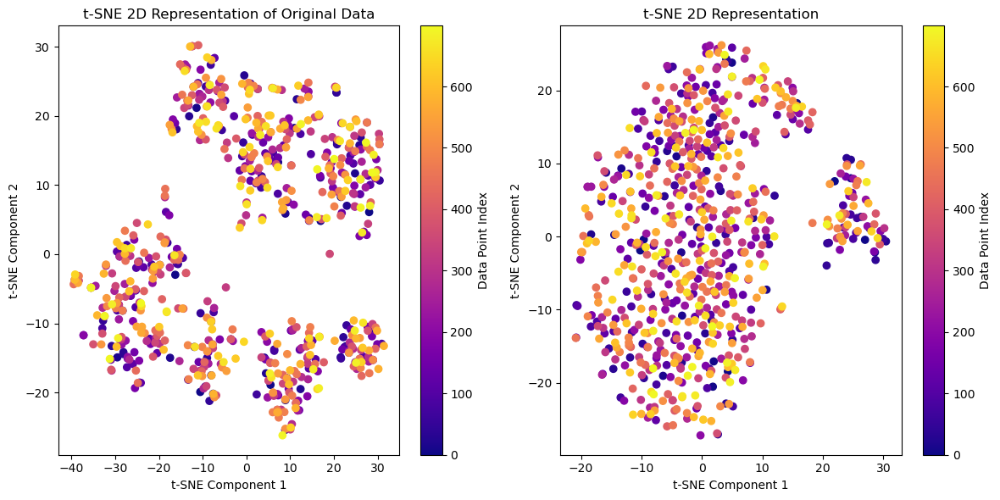

In [31]:
tab.tsne_plot(enc_val,700)

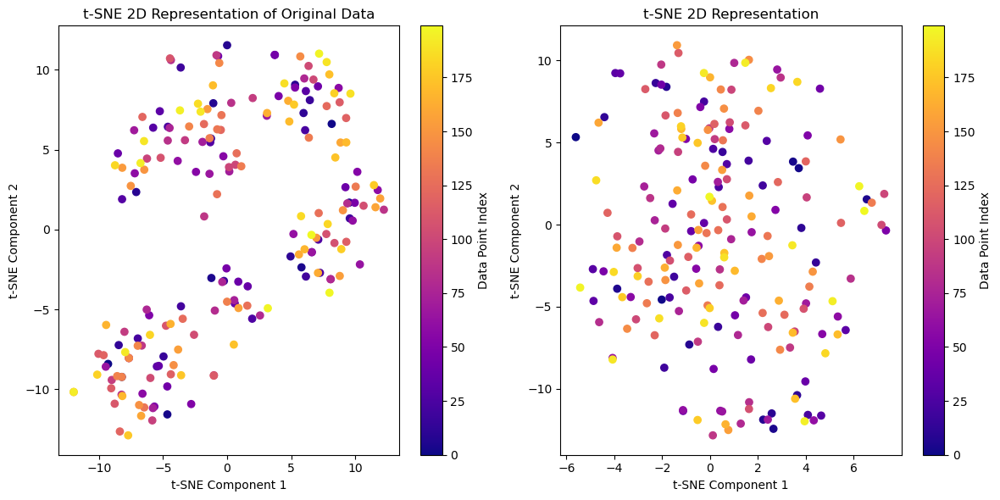

In [32]:
tab.tsne_plot(enc_val,200)

In [33]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


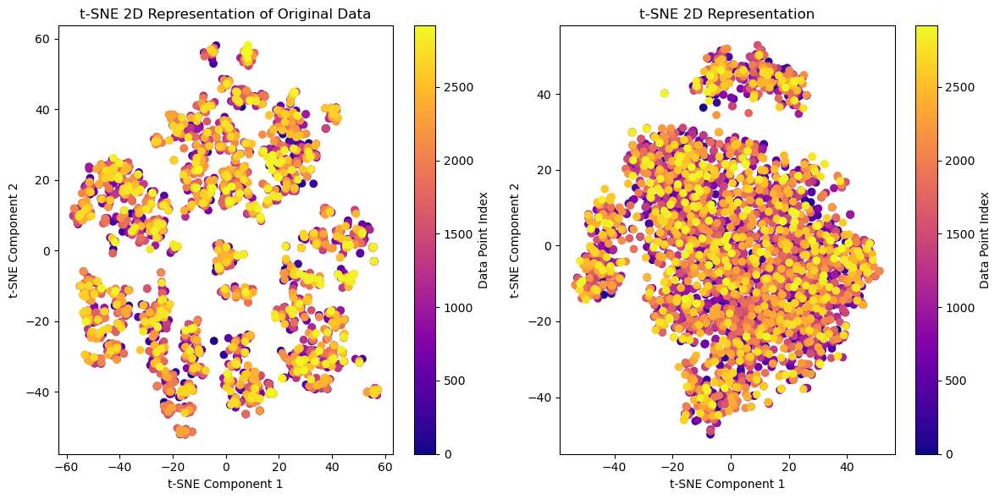

In [34]:
tab.tsne_plot(enc_val,-1)

In [35]:
scale = Scaling.min_max_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [36]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [37]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [38]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,0.50,0.195481,0.428571,0.043796
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.000000,0.0,0.0,0.0,0.000000,0.363636,0.25,0.191802,0.285714,0.233577
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.000000,0.0,0.0,0.0,0.000000,0.727273,0.50,0.207742,0.428571,0.058394
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.268775,0.0,0.0,0.0,0.000000,0.090909,0.00,0.187336,0.142857,0.671533
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.50,0.263531,0.428571,0.065693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,0.000000,0.0,0.0,0.0,0.000000,0.636364,0.25,0.198459,0.285714,0.065693
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,1.00,0.287353,0.285714,0.240876
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,0.000000,0.0,0.0,0.0,0.147059,0.363636,1.00,0.276581,0.142857,0.510949
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,0.110672,0.0,0.0,0.0,0.000000,0.272727,1.00,0.159573,0.142857,0.445255


In [39]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [40]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8175416834444097
mean squared error:  1063459732.0632937
rmse:  39521.89848808403
----------
Model Performance For Test Set
----------
r2_score:  0.7982338675833769
mean squared error:  1561980460.1024187
rmse:  39521.89848808403
----------
LinearRegression()
__________


In [41]:
np.log(run.get("rmse"))

10.584610189675582

In [42]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9787532430319246
mean squared error:  123836889.97590446
rmse:  32386.23803821284
----------
Model Performance For Test Set
----------
r2_score:  0.8645142312811704
mean squared error:  1048868414.2677841
rmse:  32386.23803821284
----------
RandomForestRegressor()
__________


In [43]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610454017155474
mean squared error:  38529083193.41553
rmse:  201416.21666814614
----------
Model Performance For Test Set
----------
r2_score:  -4.24036504032512
mean squared error:  40568492336.90959
rmse:  201416.21666814614
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568492336.9096,
 'rmse': 201416.2167}

#### Encoding with 0.4 dropout

In [44]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.4)
enc_val = tab.encode()

CPU times: total: 47.6 s
Wall time: 25.7 s


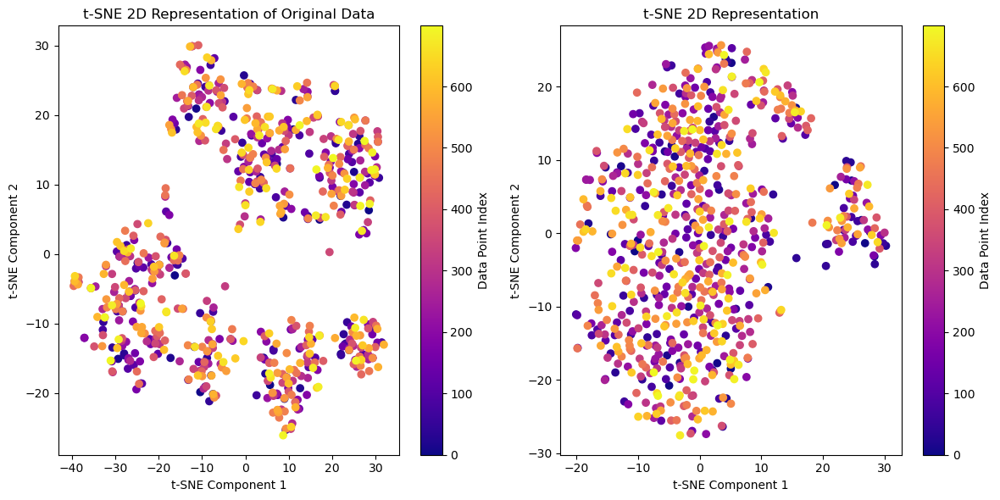

In [45]:
tab.tsne_plot(enc_val,700)

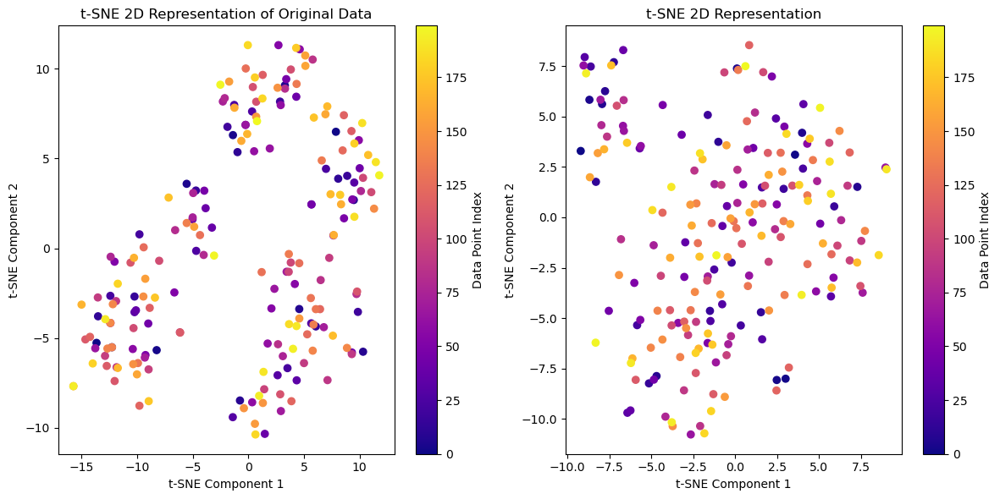

In [46]:
tab.tsne_plot(enc_val,200)

In [47]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


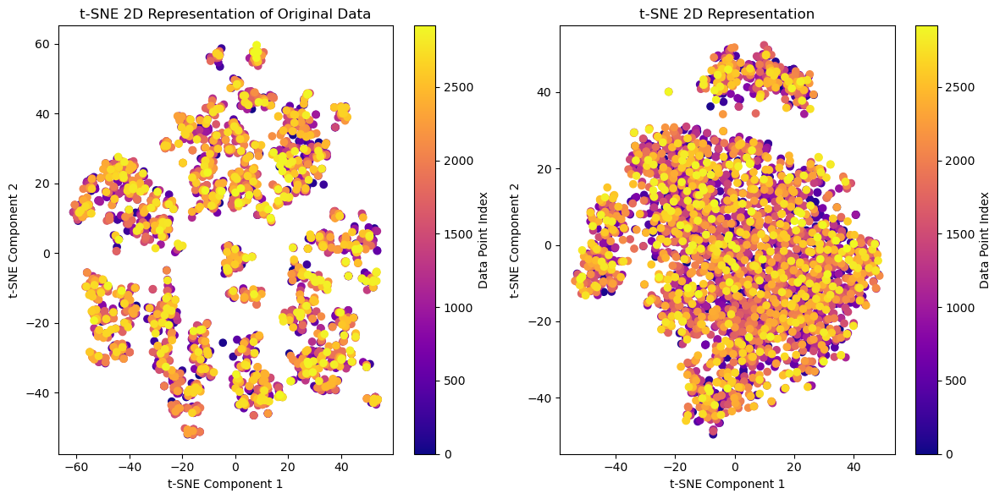

In [48]:
tab.tsne_plot(enc_val,-1)

In [49]:
scale = Scaling.min_max_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [50]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [51]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [52]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,0.50,0.195481,0.428571,0.043796
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.000000,0.0,0.0,0.0,0.000000,0.363636,0.25,0.191802,0.285714,0.233577
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.000000,0.0,0.0,0.0,0.000000,0.727273,0.50,0.207742,0.428571,0.058394
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.268775,0.0,0.0,0.0,0.000000,0.090909,0.00,0.187336,0.142857,0.671533
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.50,0.263531,0.428571,0.065693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,0.000000,0.0,0.0,0.0,0.000000,0.636364,0.25,0.198459,0.285714,0.065693
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,1.00,0.287353,0.285714,0.240876
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,0.000000,0.0,0.0,0.0,0.147059,0.363636,1.00,0.276581,0.142857,0.510949
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,0.110672,0.0,0.0,0.0,0.000000,0.272727,1.00,0.159573,0.142857,0.445255


In [53]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [54]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8175416834444097
mean squared error:  1063459732.0632937
rmse:  39521.89848808403
----------
Model Performance For Test Set
----------
r2_score:  0.7982338675833769
mean squared error:  1561980460.1024187
rmse:  39521.89848808403
----------
LinearRegression()
__________


In [55]:
np.log(run.get("rmse"))

10.584610189675582

In [56]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9787033371659911
mean squared error:  124127766.70772965
rmse:  31816.43726715636
----------
Model Performance For Test Set
----------
r2_score:  0.869239742847628
mean squared error:  1012285680.3748962
rmse:  31816.43726715636
----------
RandomForestRegressor()
__________


In [57]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453941258953
mean squared error:  38529082751.052055
rmse:  201416.20265776527
----------
Model Performance For Test Set
----------
r2_score:  -4.240364311292386
mean squared error:  40568486693.073975
rmse:  201416.20265776527
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568486693.074,
 'rmse': 201416.2027}

#### Encoding with 0.8 dropout

In [58]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.8)
enc_val = tab.encode()

CPU times: total: 45.7 s
Wall time: 24.5 s


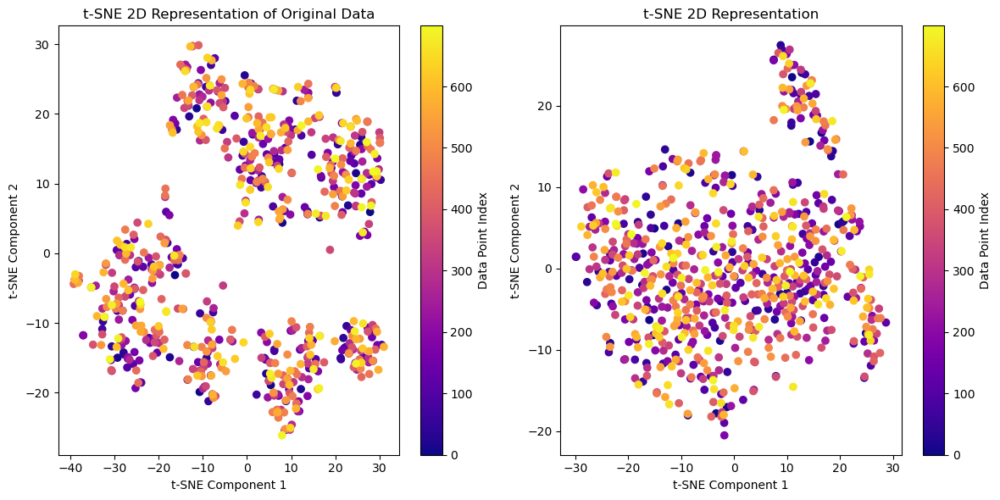

In [59]:
tab.tsne_plot(enc_val,700)

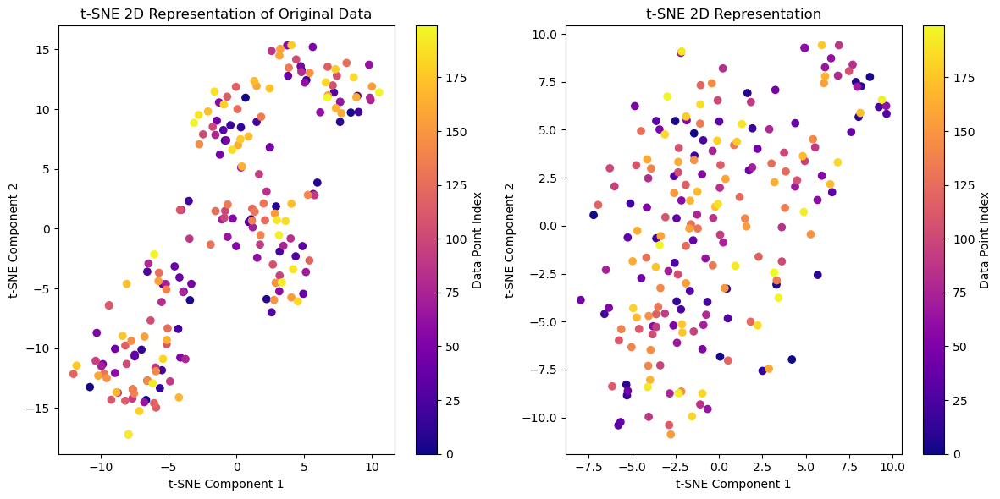

In [60]:
tab.tsne_plot(enc_val,200)

In [61]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


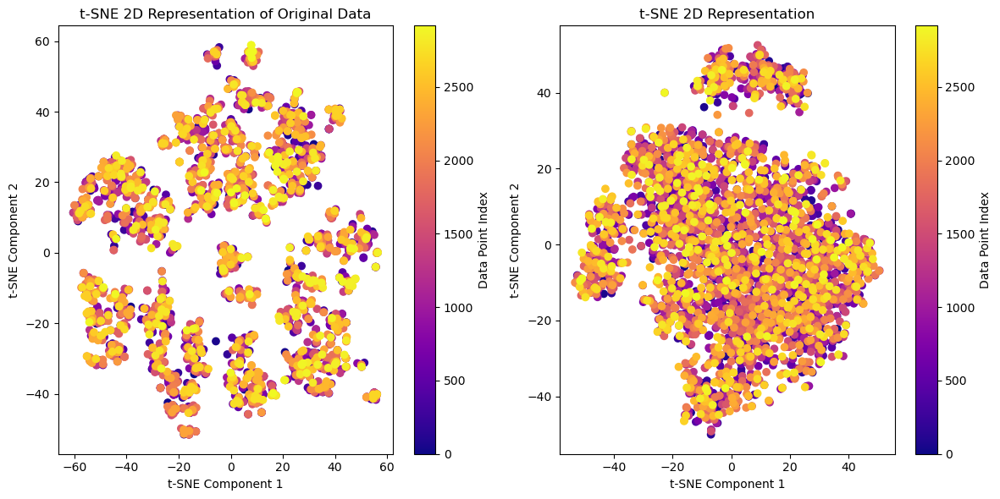

In [62]:
tab.tsne_plot(enc_val,-1)

In [63]:
scale = Scaling.min_max_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [64]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [65]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [66]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,0.50,0.195481,0.428571,0.043796
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.000000,0.0,0.0,0.0,0.000000,0.363636,0.25,0.191802,0.285714,0.233577
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.000000,0.0,0.0,0.0,0.000000,0.727273,0.50,0.207742,0.428571,0.058394
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.268775,0.0,0.0,0.0,0.000000,0.090909,0.00,0.187336,0.142857,0.671533
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.50,0.263531,0.428571,0.065693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,0.000000,0.0,0.0,0.0,0.000000,0.636364,0.25,0.198459,0.285714,0.065693
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,1.00,0.287353,0.285714,0.240876
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,0.000000,0.0,0.0,0.0,0.147059,0.363636,1.00,0.276581,0.142857,0.510949
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,0.110672,0.0,0.0,0.0,0.000000,0.272727,1.00,0.159573,0.142857,0.445255


In [67]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [68]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8175416834444097
mean squared error:  1063459732.0632937
rmse:  39521.89848808403
----------
Model Performance For Test Set
----------
r2_score:  0.7982338675833769
mean squared error:  1561980460.1024187
rmse:  39521.89848808403
----------
LinearRegression()
__________


In [69]:
np.log(run.get("rmse"))

10.584610189675582

In [70]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.979288681963528
mean squared error:  120716079.95480703
rmse:  32687.835569942938
----------
Model Performance For Test Set
----------
r2_score:  0.8619790533261366
mean squared error:  1068494594.2476268
rmse:  32687.835569942938
----------
RandomForestRegressor()
__________


In [71]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610454284640619
mean squared error:  38529084752.454796
rmse:  201416.2197286661
----------
Model Performance For Test Set
----------
r2_score:  -4.240365199579843
mean squared error:  40568493569.7863
rmse:  201416.2197286661
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568493569.7863,
 'rmse': 201416.2197}

#### Dropout 0.5

In [72]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=8,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 45.2 s
Wall time: 24 s


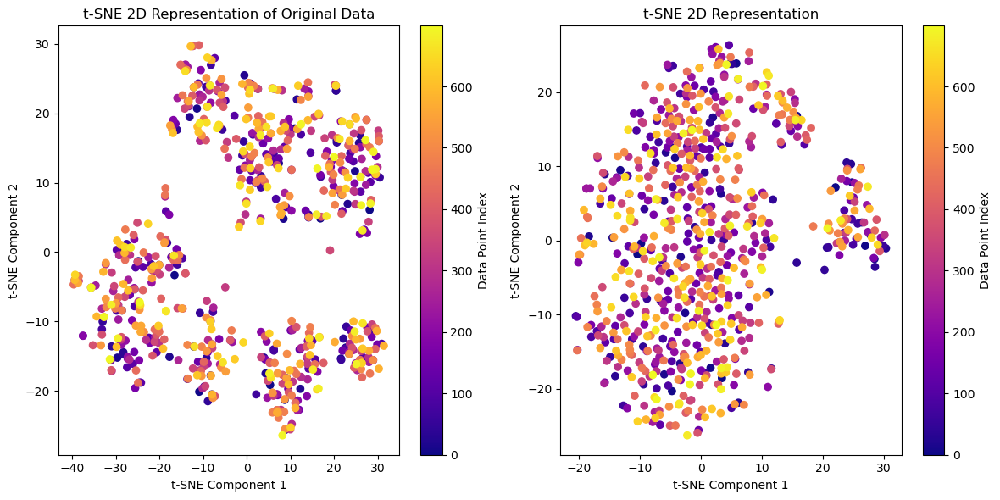

In [73]:
tab.tsne_plot(enc_val,700)

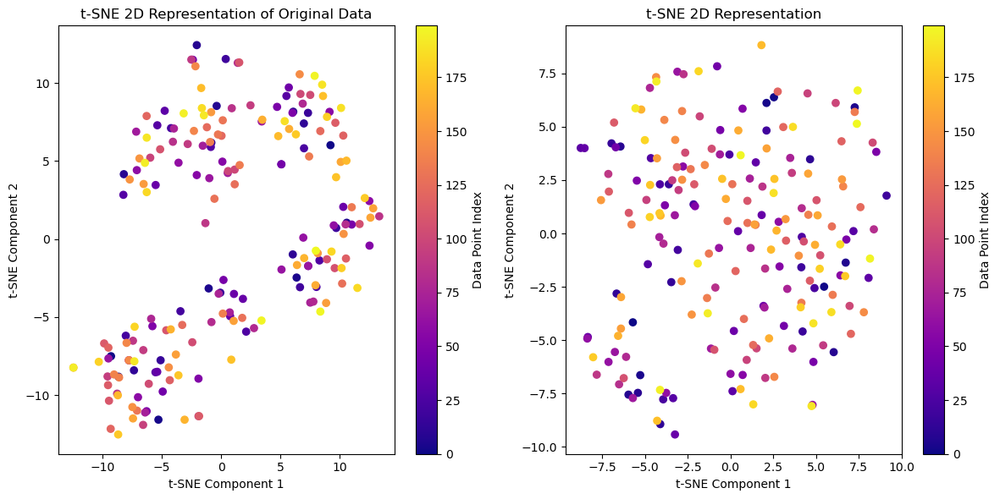

In [74]:
tab.tsne_plot(enc_val,200)

In [75]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.862362,-0.289088,-0.140465,0.960579,0.600049,-0.080563,1.182404,-1.638155,1.827119,0.624336
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-1.404588,-0.634387,-0.828933,0.187953,1.615865,0.799441,1.125492,1.136191,-0.114127,1.871934
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.497678,-0.605328,-0.887332,-0.170796,0.515393,0.603092,1.363622,1.276287,0.226594,1.743047
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.129379,-0.819206,-1.752151,0.332648,1.226892,0.243971,1.359087,1.148455,0.597140,1.608402
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-1.113139,0.233663,0.447195,1.997967,-0.581631,-0.909021,0.572338,-0.615767,0.974865,1.013483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.268198,-1.258893,-0.118868,-1.727724,0.025385,-0.211932,0.620757,0.784737,-2.280497,-0.910085,...,-1.605157,-0.919533,-0.508199,1.141378,1.466546,0.316275,0.558053,1.044124,1.075009,2.026670
2915,0.167087,-0.569349,-0.155540,-1.665340,0.385929,0.140954,-0.247210,1.778632,-1.465358,-1.716939,...,-1.178180,-0.282585,-1.193979,0.973186,1.828992,1.245861,0.651505,1.262269,0.980222,-0.526905
2916,0.347540,-0.755234,0.534088,-1.799136,-0.785978,0.035878,-0.028986,1.536004,-1.502520,-1.840009,...,-0.755548,-0.579579,-0.823263,0.951941,1.512888,-0.629639,1.351069,0.746854,0.460058,1.141746
2917,0.020423,-0.964119,-0.167661,-1.928239,-0.646505,0.160454,0.989922,0.875297,-1.318081,-1.521535,...,-0.814709,-0.599163,-0.644026,0.871482,1.221124,0.307900,1.135981,1.052134,-0.122319,2.279416


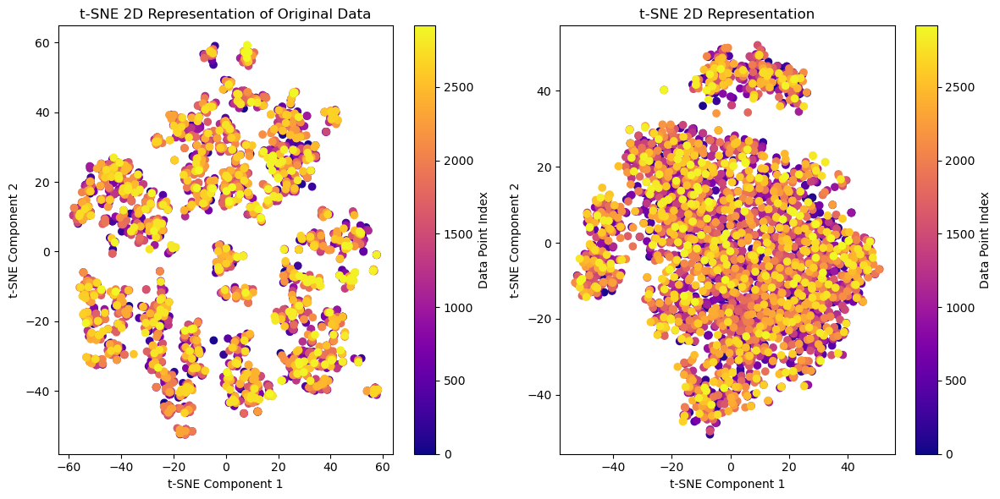

In [76]:
tab.tsne_plot(enc_val,-1)

### Another

#### min_max_scaling

In [77]:
scale = Scaling.min_max_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [78]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [79]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [80]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,0.50,0.195481,0.428571,0.043796
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,0.000000,0.0,0.0,0.0,0.000000,0.363636,0.25,0.191802,0.285714,0.233577
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,0.000000,0.0,0.0,0.0,0.000000,0.727273,0.50,0.207742,0.428571,0.058394
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,0.268775,0.0,0.0,0.0,0.000000,0.090909,0.00,0.187336,0.142857,0.671533
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,0.000000,0.0,0.0,0.0,0.000000,1.000000,0.50,0.263531,0.428571,0.065693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,0.000000,0.0,0.0,0.0,0.000000,0.636364,0.25,0.198459,0.285714,0.065693
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,0.000000,0.0,0.0,0.0,0.000000,0.090909,1.00,0.287353,0.285714,0.240876
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,0.000000,0.0,0.0,0.0,0.147059,0.363636,1.00,0.276581,0.142857,0.510949
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,0.110672,0.0,0.0,0.0,0.000000,0.272727,1.00,0.159573,0.142857,0.445255


In [81]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [82]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8175416834444097
mean squared error:  1063459732.0632937
rmse:  39521.89848808403
----------
Model Performance For Test Set
----------
r2_score:  0.7982338675833769
mean squared error:  1561980460.1024187
rmse:  39521.89848808403
----------
LinearRegression()
__________


In [83]:
np.log(run.get("rmse"))

10.584610189675582

In [84]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9775215840458666
mean squared error:  131015624.05628528
rmse:  31557.529967141356
----------
Model Performance For Test Set
----------
r2_score:  0.8713592157247596
mean squared error:  995877697.6270247
rmse:  31557.529967141356
----------
RandomForestRegressor()
__________


In [85]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.61045457973561
mean squared error:  38529086472.41827
rmse:  201416.23552094836
----------
Model Performance For Test Set
----------
r2_score:  -4.240366021334215
mean squared error:  40568499931.43014
rmse:  201416.23552094836
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568499931.4301,
 'rmse': 201416.2355}

#### z_score_scaling 

In [86]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [87]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [88]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [89]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.088427,-0.748519,-0.190104,-1.118384,-0.757864,-0.775655,0.348871,-0.076835,-1.823076,-1.358577,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.136489,-0.909449,0.266661,-1.405577,-0.369793,-0.157416,0.994205,1.978465,-1.750584,-1.459107,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.380519,-1.228058,0.331890,-1.503649,-1.557516,0.156014,1.278744,0.551783,-0.485420,-0.763580,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,0.043683,-1.528888,0.230833,-1.073575,-1.331412,-0.565572,0.635906,0.471753,-0.629996,-0.976595,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.308779,0.310931,-0.343736,-2.085255,-0.939978,-0.292963,0.396799,1.102205,-2.077369,-1.229217,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.315406,-0.672392,1.222189,-2.514300,-1.077563,0.251528,-0.132992,0.927103,-1.820237,-0.711314,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.547813,-0.758147,0.238274,-1.448761,-1.213663,-0.085510,0.013602,1.351676,-1.701186,-1.353562,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,0.561190,-1.673232,-0.144377,-1.833515,-0.131489,0.113227,0.607015,0.938341,-1.773276,-1.103881,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.135022,-0.302235,-0.325598,-0.406612,-0.368872,-0.036057,0.196308,1.492479,-1.949154,-1.641693,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [90]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [91]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8174435731318483
mean squared error:  1064031568.7911494
rmse:  39125.264500239056
----------
Model Performance For Test Set
----------
r2_score:  0.8022633165532261
mean squared error:  1530786322.2136664
rmse:  39125.264500239056
----------
LinearRegression()
__________


In [92]:
np.log(run.get("rmse"))

10.574523688202989

In [93]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9779526556207515
mean squared error:  128503119.9940906
rmse:  32003.45281059333
----------
Model Performance For Test Set
----------
r2_score:  0.8676980195758478
mean squared error:  1024220991.7998743
rmse:  32003.45281059333
----------
RandomForestRegressor()
__________


In [94]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610454196071384
mean squared error:  38529084236.22831
rmse:  201416.1855592775
----------
Model Performance For Test Set
----------
r2_score:  -4.240363421569514
mean squared error:  40568479805.24931
rmse:  201416.1855592775
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568479805.2493,
 'rmse': 201416.1856}

#### Robust Scaling

In [95]:
scale = Scaling.robust_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [96]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [97]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.817541683444993
mean squared error:  1063459732.0598941
rmse:  39521.89849647178
----------
Model Performance For Test Set
----------
r2_score:  0.7982338674977351
mean squared error:  1561980460.7654183
rmse:  39521.89849647178
----------
LinearRegression()
__________


In [98]:
np.log(run.get("rmse"))

10.584610189675582

In [99]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9792318186716521
mean squared error:  121047508.09841935
rmse:  31639.823579997483
----------
Model Performance For Test Set
----------
r2_score:  0.8706874192913162
mean squared error:  1001078436.1733648
rmse:  31639.823579997483
----------
RandomForestRegressor()
__________


In [100]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610455415457232
mean squared error:  38529091343.428314
rmse:  201416.24159176793
----------
Model Performance For Test Set
----------
r2_score:  -4.240366337230469
mean squared error:  40568502376.95342
rmse:  201416.24159176793
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568502376.9534,
 'rmse': 201416.2416}

### Expand Linear Layer in Encoder `50`,`128`, `256`, `512`, `768`, `1024`, `2048`.

#### Layer 50

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=50,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 49.1 s
Wall time: 26.5 s


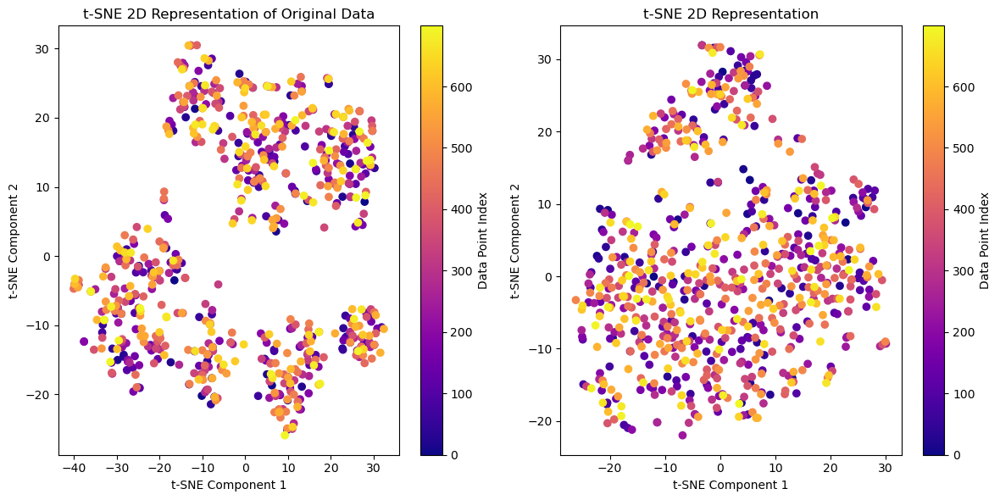

In [ ]:
tab.tsne_plot(enc_val,700)

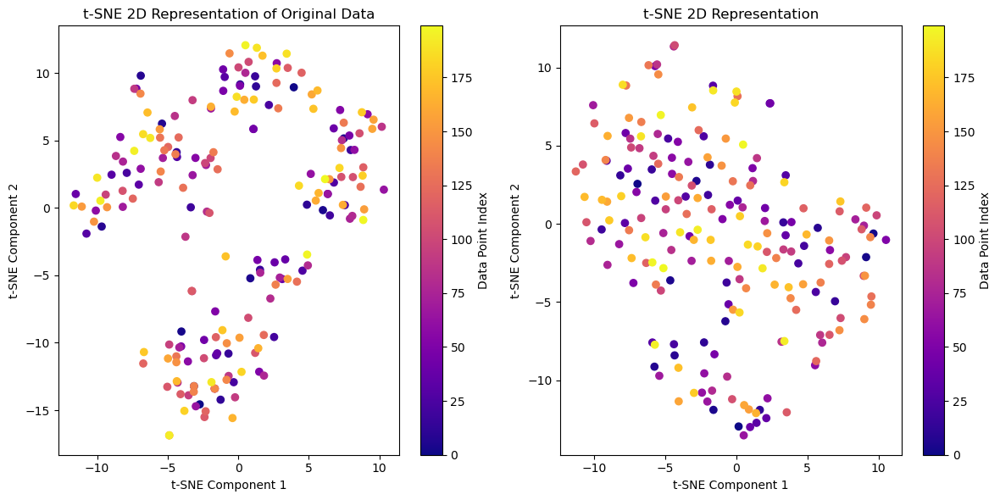

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.293069,-0.040645,0.584073,-1.728230,-1.248646,-0.142344,-1.138581,0.958035,-0.297878,0.937954,...,-0.674348,-0.945370,-0.030636,-0.434063,-1.162939,0.181986,0.233401,-0.165262,1.090949,-0.041473
1,0.185161,-0.081998,-0.869163,-1.571759,-0.502913,-0.545876,-0.385484,1.395344,0.199742,-1.135425,...,-0.728701,1.449934,0.286435,-0.193817,-0.670794,-1.014455,-0.845790,1.605041,0.182736,-0.741906
2,0.821334,-0.645576,-1.305415,-0.493556,-0.108636,0.017751,0.089048,-0.855153,-0.074826,-0.927042,...,-1.404201,0.585231,-2.682164,0.501816,-0.452683,0.585145,0.482250,1.349918,0.681651,0.219657
3,1.847902,-0.221757,-1.364058,-0.759319,-0.433361,-0.798375,-1.046181,-0.248655,-0.097491,-1.069928,...,-0.903219,0.212880,-0.931127,0.484383,-1.199227,0.709478,-0.395611,0.608713,1.085551,-0.394600
4,-0.180253,0.026796,0.004085,-2.351192,-0.587276,-1.083172,-0.201550,1.408607,0.362624,1.382623,...,-0.607116,0.134034,0.208262,0.094508,-0.719923,-0.027535,-0.274716,0.623288,0.067858,-0.121374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.700731,-0.308324,-1.765191,-1.616172,-0.653378,0.487514,-1.427993,0.205365,0.242205,-0.799922,...,-0.637922,0.264166,-0.950345,0.856383,-0.320552,-0.733793,0.377254,1.160582,1.780009,-0.631913
2915,0.809145,-0.163314,-1.023866,-1.731475,-0.655688,0.416307,-1.266804,0.287591,0.643836,-1.382184,...,-0.703379,0.655596,-0.961860,0.641465,-0.340982,-0.748521,-0.347869,0.561984,1.614188,-0.937375
2916,0.285413,-0.168911,0.454573,-1.112155,0.421558,0.326600,-1.742633,-0.774434,-0.013169,-0.480865,...,-0.771472,0.368482,-1.760041,0.858804,-0.334926,0.926693,-0.793023,1.389979,0.787838,-1.535183
2917,0.366492,0.441936,-1.361695,-0.283812,-0.056362,0.324926,-1.624178,0.148381,-0.184334,-0.947697,...,-1.225276,-0.142410,-2.136982,1.329350,-0.759141,0.394816,-0.547776,1.160015,1.598982,-0.129725


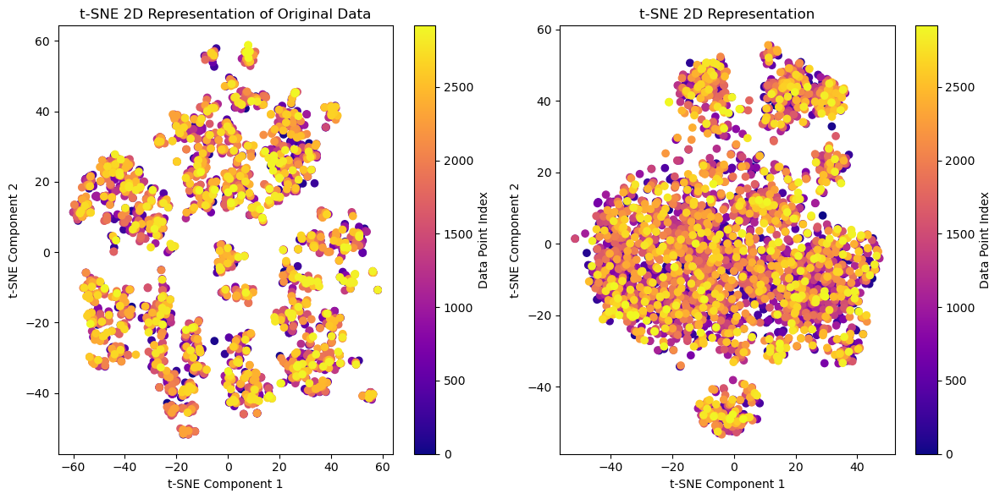

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.293069,-0.040645,0.584073,-1.728230,-1.248646,-0.142344,-1.138581,0.958035,-0.297878,0.937954,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.185161,-0.081998,-0.869163,-1.571759,-0.502913,-0.545876,-0.385484,1.395344,0.199742,-1.135425,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,0.821334,-0.645576,-1.305415,-0.493556,-0.108636,0.017751,0.089048,-0.855153,-0.074826,-0.927042,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,1.847902,-0.221757,-1.364058,-0.759319,-0.433361,-0.798375,-1.046181,-0.248655,-0.097491,-1.069928,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-0.180253,0.026796,0.004085,-2.351192,-0.587276,-1.083172,-0.201550,1.408607,0.362624,1.382623,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.868398,0.527265,0.706181,-1.720795,-1.633364,-0.326165,-0.996814,0.636270,-0.538003,0.988894,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.043759,-0.221107,0.225714,-1.690486,-1.854643,1.135263,-0.960656,1.844777,-0.635502,0.529187,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,1.204540,-0.607251,-0.284039,-1.386869,-0.933221,-0.227842,-0.796054,0.404383,0.026912,-0.447951,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.071699,-0.115952,0.091997,-1.538564,-1.816514,0.829221,-1.024126,0.935612,-0.221739,0.731250,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8169807148875708
mean squared error:  1066729341.7057242
rmse:  39828.05155426632
----------
Model Performance For Test Set
----------
r2_score:  0.7950958314244887
mean squared error:  1586273690.6092958
rmse:  39828.05155426632
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.59232675707809

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9748393032810728
mean squared error:  146649318.57509375
rmse:  36643.95242882391
----------
Model Performance For Test Set
----------
r2_score:  0.8265488059533631
mean squared error:  1342779249.6059098
rmse:  36643.95242882391
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.6104532620453496
mean squared error:  38529078792.25023
rmse:  201416.16836815656
----------
Model Performance For Test Set
----------
r2_score:  -4.240362527026532
mean squared error:  40568472880.10959
rmse:  201416.16836815656
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568472880.1096,
 'rmse': 201416.1684}

#### Layer 128 

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=128,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 48.9 s
Wall time: 27.1 s


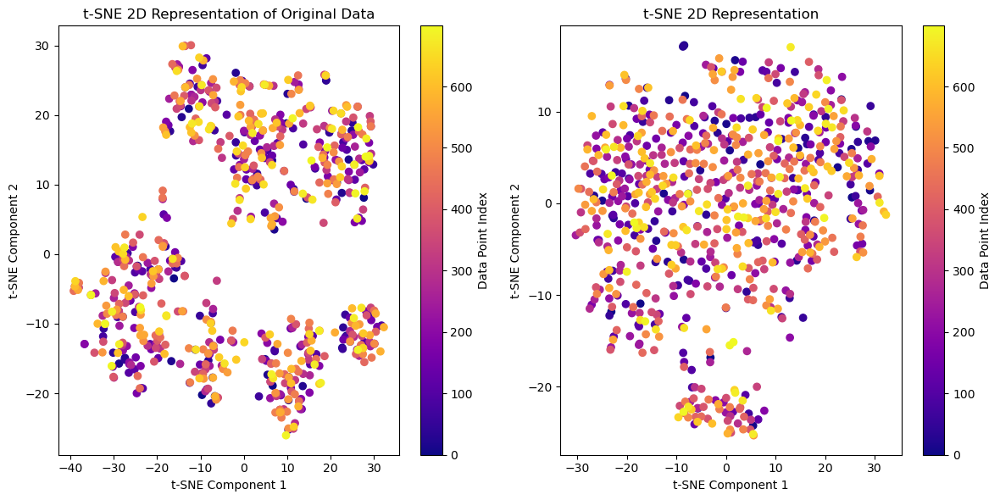

In [ ]:
tab.tsne_plot(enc_val,700)

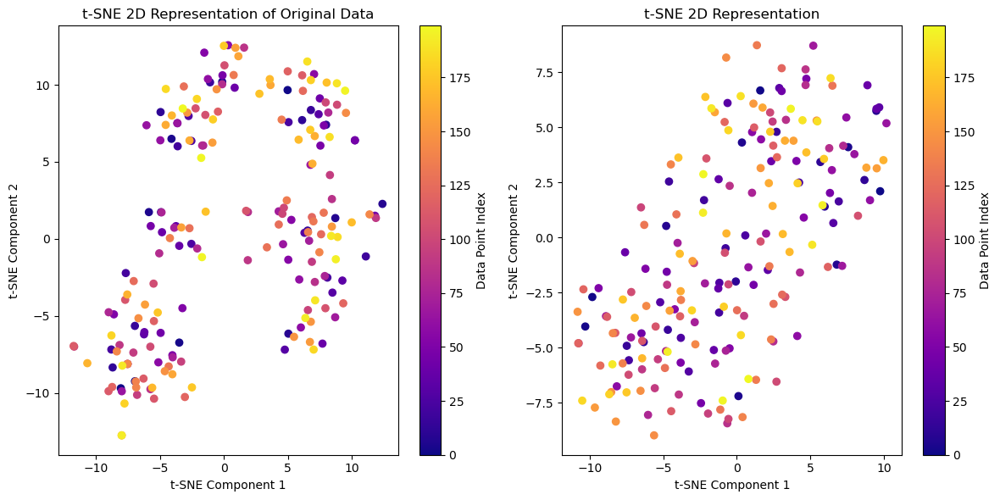

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.609916,0.802656,-0.553913,0.967356,-0.676877,0.981833,-1.804033,0.954286,-0.155583,0.328153,...,-0.172494,0.034447,-0.340089,-1.063089,0.121800,-1.273781,-0.997152,-0.743713,1.539314,0.259110
1,-1.212334,0.748836,-0.814084,1.734864,0.196218,-0.691609,-1.466515,2.295184,0.422649,0.350484,...,1.313242,0.581744,-0.869318,-0.749336,-0.957641,-1.412621,-0.543294,0.594696,-0.325609,-1.233580
2,-1.545271,-0.258547,-0.707031,2.204130,-0.631439,-0.491893,-0.825343,-0.319515,-0.272070,0.014449,...,0.061307,0.256852,-0.537054,-0.847477,-0.873707,-1.691106,0.540705,0.708081,1.043713,-0.176400
3,-1.192281,-0.185881,-0.530367,2.105547,-0.799641,-0.493439,-0.777727,-0.074167,0.063667,0.831788,...,0.109301,-0.080024,-0.214920,-0.577457,-1.152896,-1.702369,0.475955,0.252724,0.480703,-1.099485
4,-1.041066,0.403726,-0.878848,1.264816,-0.722274,-0.535665,-0.950430,1.208615,-0.258662,0.287193,...,0.832350,-0.351479,0.274436,-1.632390,-0.480248,-1.664416,-0.258606,0.703713,0.756754,-0.405688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-1.149594,-0.194759,-0.464179,1.767708,-0.330122,-0.559486,-1.638401,1.280414,0.275090,0.514697,...,0.771480,-0.335167,-0.665428,-1.252616,-0.947974,-1.136579,0.335923,1.120328,0.232730,-1.209291
2915,-1.266198,-0.065966,-0.273755,2.047608,-0.745444,-0.163319,-1.584199,1.279161,0.051656,0.833690,...,0.867684,-0.237326,-0.740007,-0.817201,-0.981062,-1.586518,0.172524,0.970575,0.478141,-1.243212
2916,-0.722353,0.443969,-0.535898,1.579911,0.508258,0.135768,-0.773806,0.355411,0.614113,0.247173,...,-0.547959,-0.456290,-0.819465,-0.943428,-0.233501,-2.226088,0.117781,0.210207,0.931914,-1.149958
2917,-1.106149,-0.458920,0.002317,2.536946,-0.439034,-0.298605,-1.400090,0.887391,-0.216945,0.302237,...,0.377902,0.566347,-0.849281,-0.700989,-0.826404,-1.339446,0.371468,0.302485,0.110198,-0.427560


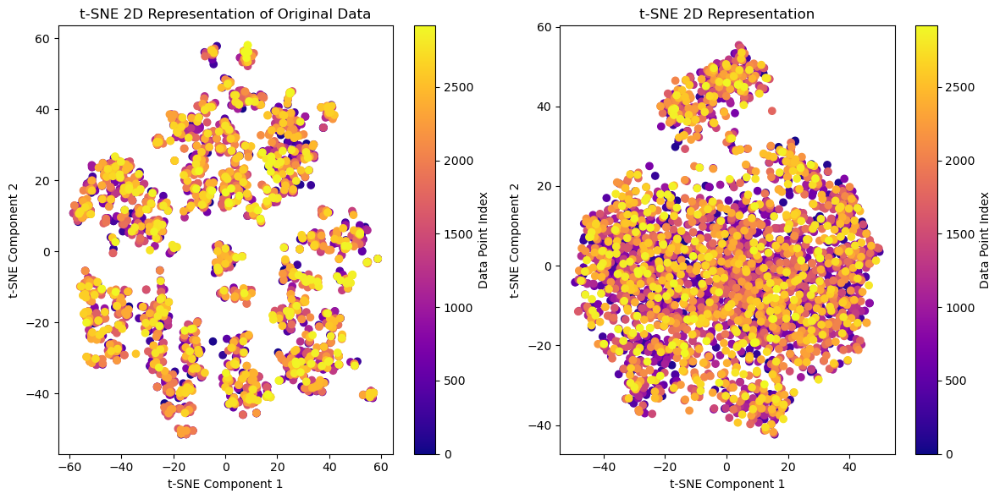

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.609916,0.802656,-0.553913,0.967356,-0.676877,0.981833,-1.804033,0.954286,-0.155583,0.328153,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-1.212334,0.748836,-0.814084,1.734864,0.196218,-0.691609,-1.466515,2.295184,0.422649,0.350484,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-1.545271,-0.258547,-0.707031,2.204130,-0.631439,-0.491893,-0.825343,-0.319515,-0.272070,0.014449,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-1.192281,-0.185881,-0.530367,2.105547,-0.799641,-0.493439,-0.777727,-0.074167,0.063667,0.831788,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-1.041066,0.403726,-0.878848,1.264816,-0.722274,-0.535665,-0.950430,1.208615,-0.258662,0.287193,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.787821,0.506025,-0.531536,1.974718,-0.724788,0.708031,-1.909940,1.092464,0.083829,0.341540,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-0.518659,0.930109,-0.888701,0.488161,-1.299675,1.386684,-1.389582,2.341583,-0.621480,0.172911,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-1.044019,-0.078021,-0.498574,2.065974,-0.826729,-0.044930,-1.347181,-0.469999,0.806465,0.154245,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.608045,0.081989,-0.168223,1.029449,-0.591464,0.599492,-1.724880,1.542205,-0.143483,-0.030569,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8149012976694456
mean squared error:  1078849241.3046083
rmse:  40159.01033354377
----------
Model Performance For Test Set
----------
r2_score:  0.7916763021741224
mean squared error:  1612746110.9696753
rmse:  40159.01033354377
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.600602110137642

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9772450921678063
mean squared error:  132627159.14062971
rmse:  31967.874290479205
----------
Model Performance For Test Set
----------
r2_score:  0.8679920186160411
mean squared error:  1021944986.6518813
rmse:  31967.874290479205
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.6104538733584
mean squared error:  38529082355.29315
rmse:  201416.19631598648
----------
Model Performance For Test Set
----------
r2_score:  -4.240363981296781
mean squared error:  40568484138.4
rmse:  201416.19631598648
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568484138.4,
 'rmse': 201416.1963}

#### Layer 256

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=256,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 48.4 s
Wall time: 26.8 s


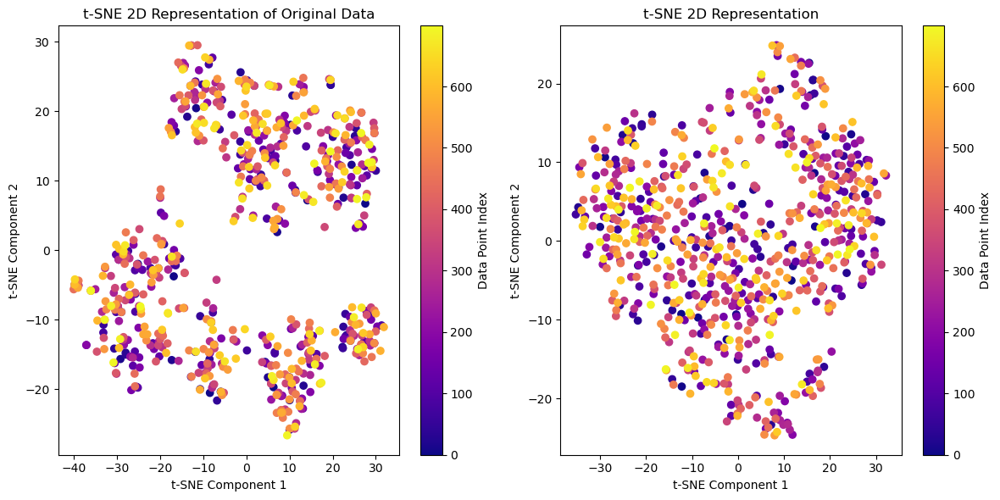

In [ ]:
tab.tsne_plot(enc_val,700)

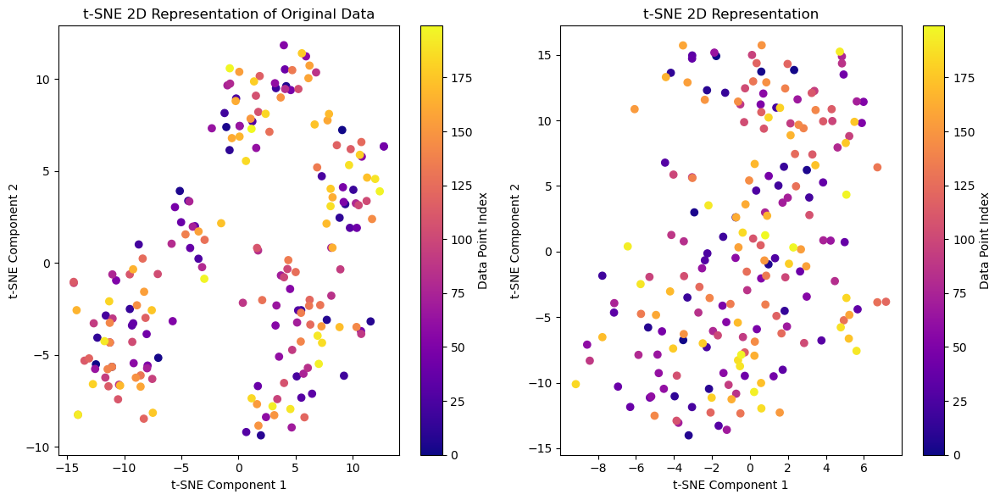

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,-0.471207,-0.636683,1.278741,-0.554309,-0.110578,-1.267554,-0.192354,-1.394077,0.200621,0.882850,...,-0.146115,-0.037578,-1.041947,-1.632493,-0.436659,-0.902462,0.546998,-0.954367,0.560883,1.098614
1,0.155423,0.192207,0.617466,-0.771761,-0.526375,-0.379707,-1.954990,2.215086,-0.187794,-0.747728,...,1.761714,0.476773,0.869778,-1.056611,0.274013,-0.698585,0.251226,-0.808725,-0.275777,-1.229733
2,-0.768072,-0.929308,0.310566,0.019315,-1.363628,-1.436520,0.524096,0.288265,0.383486,-0.300730,...,0.351950,-0.369476,-0.333513,-0.950857,-0.377734,0.109319,-0.305078,-0.050462,-0.442315,0.959860
3,-0.094124,-0.742677,0.311314,-0.160676,-0.323577,-1.772419,0.173678,0.758931,0.368538,-0.332127,...,0.270436,-0.205212,0.251318,-1.793563,-0.332769,-0.698405,-0.074279,-1.586853,-0.033046,0.815750
4,-0.511468,-0.706248,-0.356786,-1.056145,-0.816067,-0.557421,-0.662084,1.611303,0.311773,-1.109509,...,0.623336,1.104837,1.397132,-1.162216,-0.228748,-0.998113,-0.114808,-2.059784,0.291354,0.157812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-0.581619,1.171349,-0.349743,-1.302372,-2.307213,0.366013,-1.729835,0.951724,-0.574716,-2.065607,...,0.758589,0.061673,0.179171,0.325450,-0.313259,0.397557,1.274801,-0.763179,1.132638,-0.095781
2915,0.628863,0.593751,0.106382,-1.411744,-2.208295,0.996503,-1.212059,1.817371,-1.202543,-0.722134,...,1.091038,0.565714,0.218660,-0.153877,-1.335706,-0.203646,0.449942,-0.033584,-0.554580,-0.588777
2916,0.035855,-0.583263,1.210198,-1.073428,-1.911256,-0.971622,-0.710411,0.362326,-0.328310,-0.267881,...,0.354011,0.619509,0.921877,-1.199423,-0.054313,-1.090667,-0.565103,-0.397988,-0.470164,-0.088274
2917,0.215653,0.608745,1.215667,-0.480174,-1.979336,-0.324400,0.516866,1.799532,-0.679920,0.288683,...,0.800372,0.294217,-0.310642,-1.370263,-0.402542,-0.493980,0.021264,-0.419122,-1.173873,0.472712


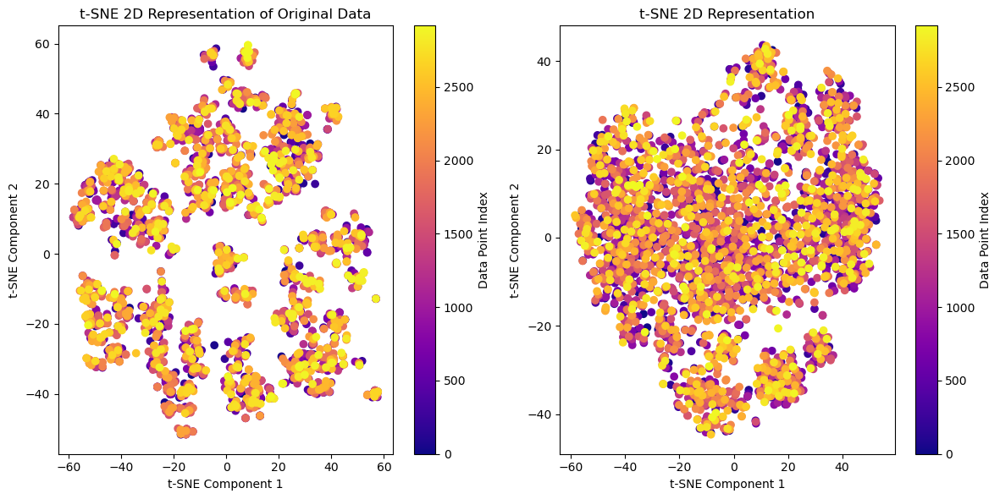

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,-0.471207,-0.636683,1.278741,-0.554309,-0.110578,-1.267554,-0.192354,-1.394077,0.200621,0.882850,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.155423,0.192207,0.617466,-0.771761,-0.526375,-0.379707,-1.954990,2.215086,-0.187794,-0.747728,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.768072,-0.929308,0.310566,0.019315,-1.363628,-1.436520,0.524096,0.288265,0.383486,-0.300730,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.094124,-0.742677,0.311314,-0.160676,-0.323577,-1.772419,0.173678,0.758931,0.368538,-0.332127,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-0.511468,-0.706248,-0.356786,-1.056145,-0.816067,-0.557421,-0.662084,1.611303,0.311773,-1.109509,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.931958,-0.464828,0.461686,-0.737376,-0.771780,-0.785021,-1.525469,-0.287370,0.677601,-0.069969,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.199760,0.184201,0.629032,-2.437579,-0.600155,-0.919017,-2.535654,0.909653,0.083602,0.018789,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-0.245191,0.545879,0.632560,-0.427706,-1.429216,0.572739,-0.800587,0.421335,-0.438471,-1.156698,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.673467,0.517583,1.143193,-1.275394,-0.218111,0.147075,-1.304556,1.655720,-0.422222,-0.303161,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8140618764024331
mean squared error:  1083741814.7567668
rmse:  40489.21583216215
----------
Model Performance For Test Set
----------
r2_score:  0.7882363548433782
mean squared error:  1639376598.70341
rmse:  40489.21583216215
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.608790941093527

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9742050129126492
mean squared error:  150346284.97261435
rmse:  33976.37870266498
----------
Model Performance For Test Set
----------
r2_score:  0.8508831057040763
mean squared error:  1154394309.7469063
rmse:  33976.37870266498
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453426792513
mean squared error:  38529079752.48036
rmse:  201416.25702317923
----------
Model Performance For Test Set
----------
r2_score:  -4.240367140206939
mean squared error:  40568508593.227394
rmse:  201416.25702317923
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568508593.2274,
 'rmse': 201416.257}

#### Layer 512

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=512,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 46.9 s
Wall time: 25.4 s


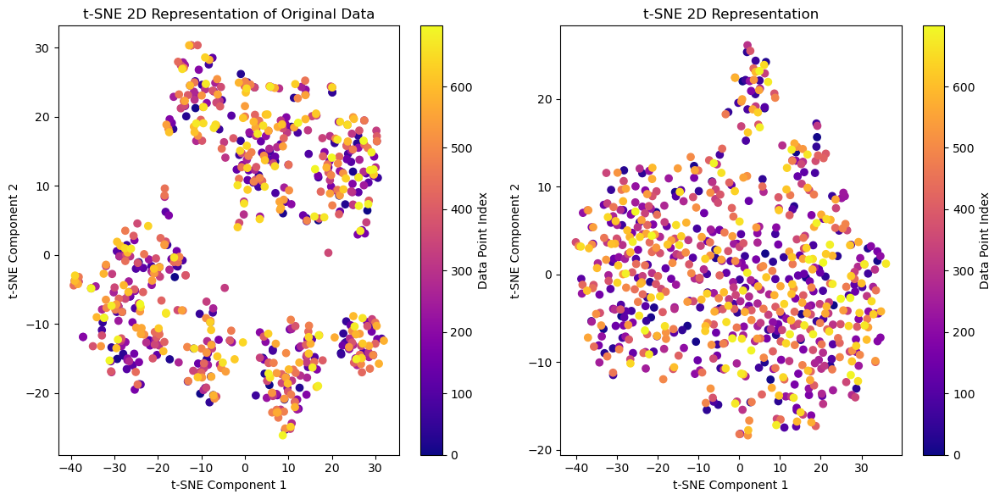

In [ ]:
tab.tsne_plot(enc_val,700)

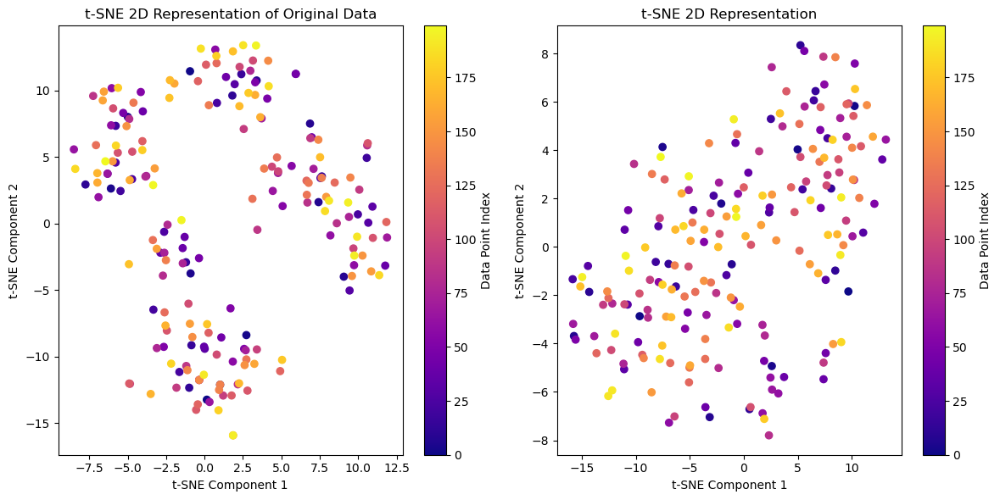

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.510136,0.021036,-2.035386,0.452097,-0.688265,-0.230032,0.512602,0.137206,0.352205,1.605904,...,0.317464,0.156832,-0.499244,-0.682630,-0.596280,0.395660,1.320789,0.274078,0.491865,0.595337
1,0.161788,0.481878,-0.390439,1.181898,0.704548,-0.834705,-0.661528,2.252264,-0.867492,0.583952,...,-0.242289,-1.735282,1.937495,-0.944735,-0.797801,-0.187743,0.252509,0.835671,0.888857,1.113627
2,1.372856,-0.421136,-1.886130,0.059984,-0.570703,-0.810246,0.676143,0.444234,-0.111069,1.911859,...,-0.184542,-0.448512,0.584097,-0.334625,-0.853443,1.183116,0.723484,-0.322436,-0.440632,0.024757
3,0.776087,0.831605,-1.557918,-0.479818,-0.551746,-1.308239,0.159614,0.820034,0.119575,1.567403,...,0.511326,-0.739687,1.273567,-0.714270,-0.706481,1.107507,-0.037701,-0.421455,-0.540630,0.306292
4,0.314520,-0.090420,-1.070422,0.524539,-0.107796,-0.292556,0.254326,1.903862,0.487900,0.836496,...,0.349253,-0.365813,0.148496,-1.041867,-1.416214,0.968913,1.439146,0.371202,-0.705449,0.525788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,0.580483,-0.806912,-0.396481,1.065892,-0.566030,-0.702366,-0.492552,2.183822,-0.337221,0.096681,...,0.538931,-1.436819,0.598463,-1.106556,-0.805042,-0.005682,1.101542,0.043958,1.564136,1.237651
2915,0.816197,-0.266378,-0.402556,0.269209,-0.342596,-0.111689,-1.136933,2.566756,-0.352738,0.426214,...,-0.354238,-2.523546,0.453988,-0.350661,0.128671,0.540034,0.868557,0.031735,1.328002,-0.182906
2916,0.546283,0.456799,-1.534936,0.834935,-0.189463,-0.983604,0.085488,1.164713,-0.076195,1.497762,...,0.220723,-0.644856,0.870670,-1.014897,-1.255085,0.886140,0.358012,0.830312,-0.090035,-0.136228
2917,0.974834,0.994438,-2.018252,0.155734,-0.548012,-1.401526,0.269660,1.661172,-0.614344,0.792856,...,0.085802,-0.022290,1.219373,-0.554584,-0.788083,1.018603,0.880320,-0.164771,-0.379101,0.366738


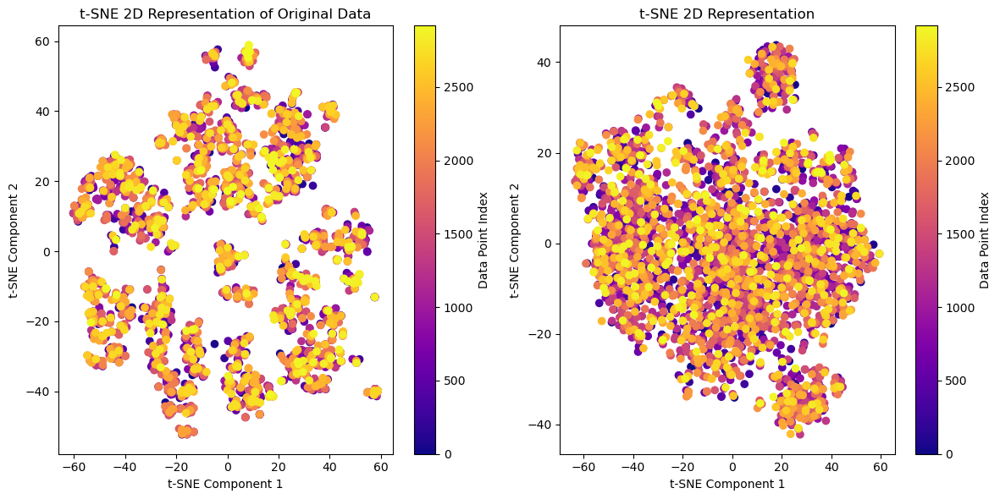

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.510136,0.021036,-2.035386,0.452097,-0.688265,-0.230032,0.512602,0.137206,0.352205,1.605904,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,0.161788,0.481878,-0.390439,1.181898,0.704548,-0.834705,-0.661528,2.252264,-0.867492,0.583952,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,1.372856,-0.421136,-1.886130,0.059984,-0.570703,-0.810246,0.676143,0.444234,-0.111069,1.911859,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,0.776087,0.831605,-1.557918,-0.479818,-0.551746,-1.308239,0.159614,0.820034,0.119575,1.567403,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,0.314520,-0.090420,-1.070422,0.524539,-0.107796,-0.292556,0.254326,1.903862,0.487900,0.836496,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.061165,-0.569801,-0.994472,0.597266,-0.703359,-0.658777,0.601273,0.840426,-0.659924,0.225160,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-0.499225,-0.039641,0.123526,1.243421,-0.075198,-1.346973,0.508911,1.825688,-0.189345,0.432066,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-0.678100,0.580979,-1.417668,0.964075,0.007941,0.310189,-0.161738,0.890549,0.090610,1.823320,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,0.824254,-0.038142,-0.005171,-0.015766,-0.186791,-1.259490,-0.376076,2.809860,0.379757,0.270120,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8148982203719536
mean squared error:  1078867177.357227
rmse:  40403.623919905585
----------
Model Performance For Test Set
----------
r2_score:  0.7891307212607526
mean squared error:  1632452825.861167
rmse:  40403.623919905585
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.606674760421441

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.974951287834088
mean squared error:  145996615.72770932
rmse:  32196.068489766443
----------
Model Performance For Test Set
----------
r2_score:  0.8661006842414503
mean squared error:  1036586826.1977316
rmse:  32196.068489766443
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453248259542
mean squared error:  38529078711.89954
rmse:  201416.230177961
----------
Model Performance For Test Set
----------
r2_score:  -4.240365743310859
mean squared error:  40568497779.10137
rmse:  201416.230177961
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568497779.1014,
 'rmse': 201416.2302}

In [ ]:
run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8148982203719536
mean squared error:  1078867177.357227
rmse:  40403.623919905585
----------
Model Performance For Test Set
----------
r2_score:  0.7891307212607526
mean squared error:  1632452825.861167
rmse:  40403.623919905585
----------
LinearRegression()
__________


{'Model Name': 'LinearRegression()',
 'r2_score': 0.7891,
 'mean squared error': 1632452825.8612,
 'rmse': 40403.6239}

In [ ]:
# from sklearn.model_selection import train_test_split
# X_train,X_test, y_train,y_test = train_test_split(train,target,test_size=0.25,random_state=24)

#### Layer 768

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=768,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 48.2 s
Wall time: 28.5 s


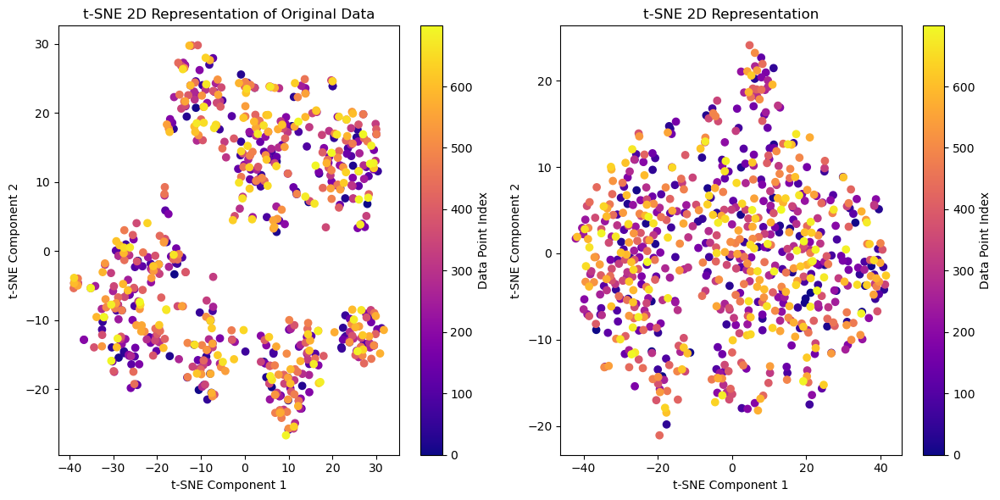

In [ ]:
tab.tsne_plot(enc_val,700)

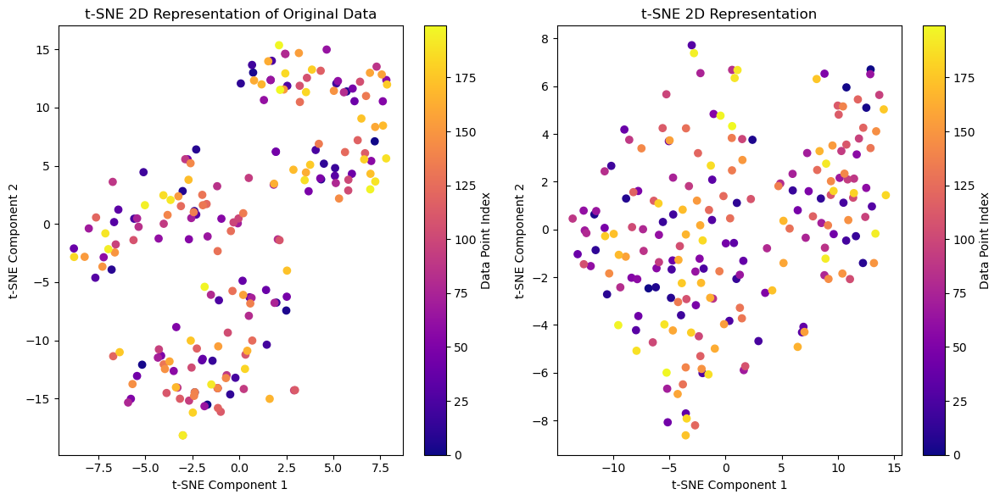

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.178446,0.300922,-0.090755,1.050194,-1.011510,0.769563,-1.785769,-0.710496,-1.046447,-0.697092,...,1.957330,1.257165,-1.112636,-0.430702,-0.174159,0.097697,0.892048,-0.119291,2.054749,-0.064674
1,-1.252077,-0.361759,1.104377,-0.601701,0.586681,0.316745,-1.680369,2.584093,1.001685,0.531146,...,0.743755,-0.316640,-0.070410,-1.715618,1.232985,-0.455938,-0.006238,-0.935786,0.149822,1.217352
2,-0.555967,0.570584,-0.171976,0.975422,-1.283382,1.523653,-1.382090,-1.514149,-1.183107,-0.197791,...,0.628484,0.345855,-0.009849,-0.984887,1.189248,-0.056355,0.733265,-0.368823,1.541910,1.380569
3,-0.587202,0.325413,0.095857,0.359998,-1.111688,0.319040,-0.323915,-1.308825,-1.343067,0.565446,...,1.113343,-0.033954,0.142596,-1.394882,1.867569,0.200679,1.160045,-0.795629,1.554086,0.183229
4,-1.222958,0.050154,0.510435,-0.629678,0.463904,0.331095,-1.709781,2.196535,-0.020215,-0.609215,...,1.974883,0.454236,-1.302463,0.688246,0.460303,-0.637388,1.942952,-0.773268,0.429778,0.263422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-1.144252,0.340070,0.609404,1.792665,0.884512,0.721377,-2.099659,-0.074341,0.198054,-0.631813,...,0.993845,0.305761,-0.122307,-2.203968,1.177494,-0.469497,-0.091501,0.303845,1.025041,1.788338
2915,-0.727205,-1.061732,0.311471,0.675749,0.610733,0.246293,-1.641786,1.269542,0.752903,-0.643834,...,2.356872,0.335177,-0.523052,-0.635964,1.528356,0.103766,0.444852,0.347531,1.570570,-1.307651
2916,-1.038405,0.544166,0.967232,0.599302,-0.590259,1.261929,-1.430466,0.900960,-0.639705,0.058005,...,1.341677,-0.795012,-0.560084,-1.866059,1.313678,1.533260,0.392262,0.108876,0.953153,0.596240
2917,-1.382656,-0.274167,0.968120,0.386922,-0.869343,1.745466,-1.290257,-0.239684,-0.654309,-0.599836,...,1.564971,0.592987,0.170200,-1.130589,1.887684,0.015794,0.020383,0.095850,1.177202,0.670791


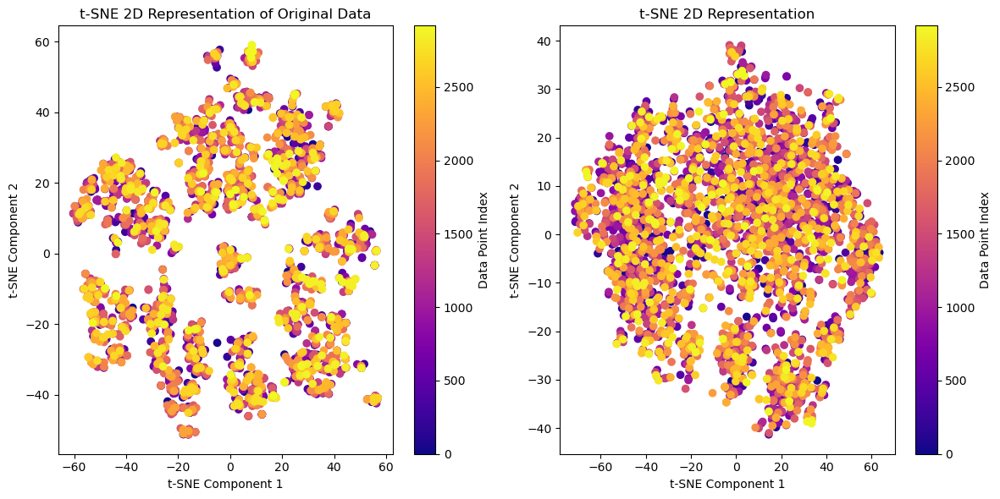

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.178446,0.300922,-0.090755,1.050194,-1.011510,0.769563,-1.785769,-0.710496,-1.046447,-0.697092,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-1.252077,-0.361759,1.104377,-0.601701,0.586681,0.316745,-1.680369,2.584093,1.001685,0.531146,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-0.555967,0.570584,-0.171976,0.975422,-1.283382,1.523653,-1.382090,-1.514149,-1.183107,-0.197791,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.587202,0.325413,0.095857,0.359998,-1.111688,0.319040,-0.323915,-1.308825,-1.343067,0.565446,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-1.222958,0.050154,0.510435,-0.629678,0.463904,0.331095,-1.709781,2.196535,-0.020215,-0.609215,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.635166,-0.129401,1.277204,-0.850457,-0.468251,0.899841,-1.916412,0.630887,-0.534464,-0.808880,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-0.741265,-0.717670,0.675181,0.168543,-0.426184,-0.115543,-1.915117,1.555435,-0.043750,-0.267590,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-0.269217,1.246458,0.430968,0.830635,-1.063814,0.945411,-2.008099,-0.626085,-1.393434,-0.540203,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.325965,-0.100518,0.933818,0.772790,0.415359,0.406190,-1.432353,1.405021,-0.629244,-0.816330,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8163925277681575
mean squared error:  1070157594.9540422
rmse:  39787.8987587355
----------
Model Performance For Test Set
----------
r2_score:  0.7955087729359986
mean squared error:  1583076887.6353862
rmse:  39787.8987587355
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.591318094788624

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9759206331051993
mean squared error:  140346779.1965327
rmse:  33884.65837636893
----------
Model Performance For Test Set
----------
r2_score:  0.8516871107160471
mean squared error:  1148170073.2832286
rmse:  33884.65837636893
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610453628583236
mean squared error:  38529080928.61918
rmse:  201416.1649636605
----------
Model Performance For Test Set
----------
r2_score:  -4.240362349872993
mean squared error:  40568471508.668495
rmse:  201416.1649636605
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568471508.6685,
 'rmse': 201416.165}

#### Layer 1024

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=1024,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 50.1 s
Wall time: 29.7 s


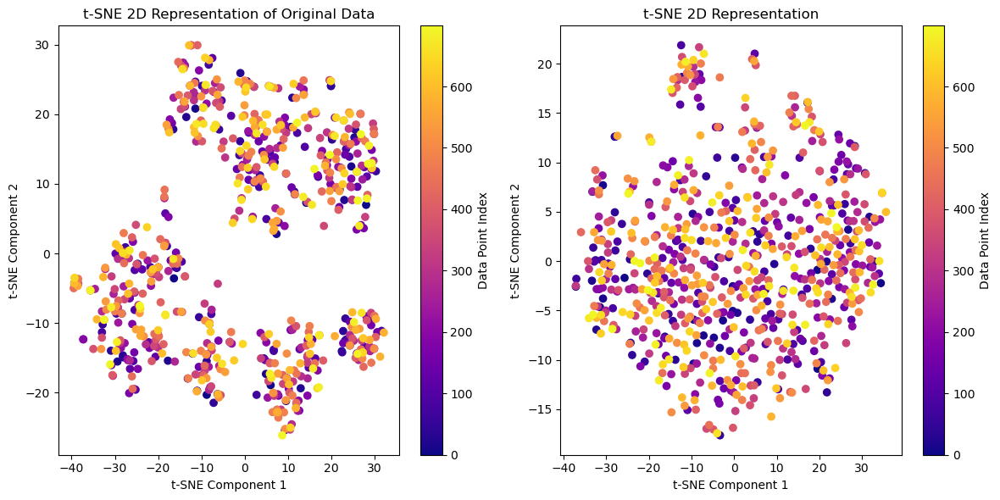

In [ ]:
tab.tsne_plot(enc_val,700)

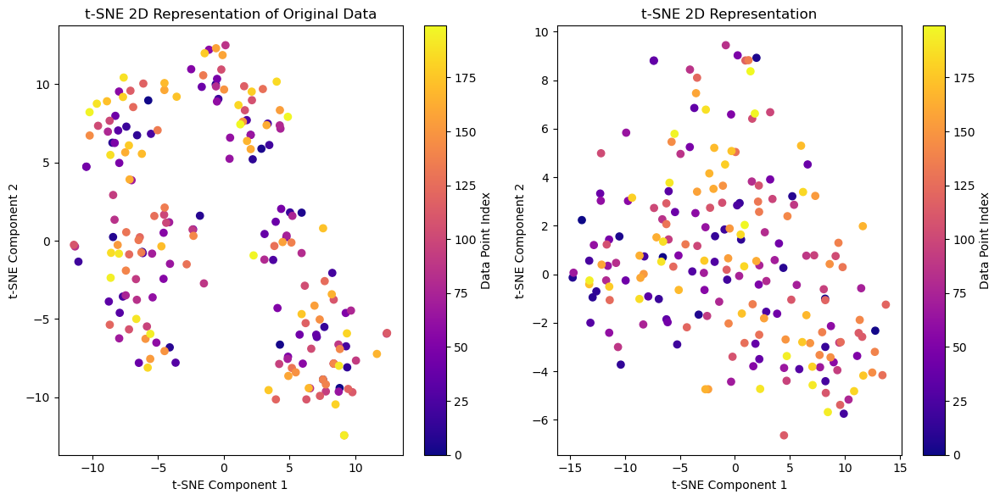

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.019703,-0.699925,1.021871,-0.429328,0.454408,-0.477732,-0.527749,0.593790,1.788736,0.354952,...,0.370970,-1.129161,-0.155239,-1.535256,-1.281318,0.120661,0.549300,-0.482391,2.293762,0.436248
1,-0.970694,0.786682,0.460335,0.584531,0.758637,0.057734,-0.992526,2.263468,0.961178,-0.102106,...,0.713025,-2.063093,0.166582,-0.977944,-0.610906,0.074593,0.850206,0.207055,1.500679,0.977287
2,-1.479496,0.569702,0.274905,0.580139,-0.890069,0.833068,-1.330341,0.007638,-0.082997,0.126744,...,0.310082,-1.144756,-0.449971,-0.624333,1.020710,0.768104,-0.589465,-0.692780,1.623162,0.502067
3,-0.214236,1.571094,0.914743,-0.488565,-0.033037,0.144075,-0.675544,0.165027,0.533204,0.316027,...,-0.223248,-2.262743,0.582639,0.668166,-0.107257,-0.087041,0.271340,-0.400554,1.436424,0.112038
4,-1.170679,0.766398,0.648102,0.107348,-0.166352,0.264989,-1.760639,2.196225,1.192595,0.187662,...,0.479434,-1.134498,0.164253,-1.115665,0.192932,0.069485,0.110360,0.064818,1.989645,0.749094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,-0.758668,0.124042,1.159007,-0.018622,0.486899,-0.619818,-1.050449,1.881872,0.669736,0.035454,...,1.010770,-1.290854,0.667133,-0.413741,-0.187930,0.341174,0.262325,-0.587827,1.680455,1.442310
2915,-0.189816,0.713373,0.298638,0.156073,0.622821,-0.859393,-1.115781,1.714378,0.436891,0.382717,...,1.243228,-2.346602,1.615701,0.002645,0.024162,0.136716,0.760337,-0.288820,1.370686,-0.049441
2916,-0.459650,1.002762,0.817707,-0.131339,0.999858,0.088033,-0.373312,1.203899,0.607620,-0.598175,...,-0.204477,-2.484538,1.156291,0.499911,-0.436131,-0.027432,0.478435,-0.030908,1.383083,0.855974
2917,-0.568092,1.663326,1.527413,-0.545521,-0.274114,0.125084,-1.599898,0.787142,0.553962,-0.111088,...,0.337109,-1.552688,-0.453588,0.113312,0.448169,0.175175,0.677645,-0.518275,0.937829,0.243587


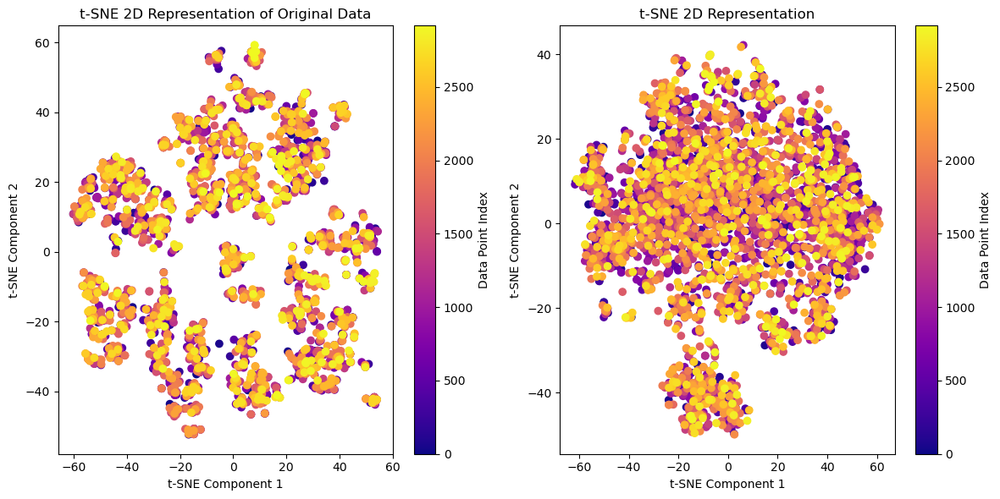

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.019703,-0.699925,1.021871,-0.429328,0.454408,-0.477732,-0.527749,0.593790,1.788736,0.354952,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,-0.970694,0.786682,0.460335,0.584531,0.758637,0.057734,-0.992526,2.263468,0.961178,-0.102106,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,-1.479496,0.569702,0.274905,0.580139,-0.890069,0.833068,-1.330341,0.007638,-0.082997,0.126744,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,-0.214236,1.571094,0.914743,-0.488565,-0.033037,0.144075,-0.675544,0.165027,0.533204,0.316027,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,-1.170679,0.766398,0.648102,0.107348,-0.166352,0.264989,-1.760639,2.196225,1.192595,0.187662,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,-0.571316,0.607045,0.226755,0.195139,0.377082,0.953123,-1.305064,1.685547,0.582889,-0.034739,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,-0.577931,0.012104,0.695007,-0.830782,0.631086,-0.012710,-0.241867,2.874025,1.351467,-0.137474,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,-0.219847,1.297310,1.137958,0.382072,0.307494,0.060497,-1.389816,0.765947,-0.215396,0.034816,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,-0.429209,1.297878,0.573068,-0.404938,-0.755704,0.525476,-1.811074,2.004975,0.900520,0.482493,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8152687356263354
mean squared error:  1076707626.2850225
rmse:  40932.91763554062
----------
Model Performance For Test Set
----------
r2_score:  0.7835696928694698
mean squared error:  1675503746.1579523
rmse:  40932.91763554062
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.619689849623702

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.976701030872913
mean squared error:  135798224.67392886
rmse:  32117.312838509395
----------
Model Performance For Test Set
----------
r2_score:  0.8667549523373642
mean squared error:  1031521783.9666805
rmse:  32117.312838509395
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452464246604
mean squared error:  38529074142.27397
rmse:  201416.19900146377
----------
Model Performance For Test Set
----------
r2_score:  -4.240364121036077
mean squared error:  40568485220.19726
rmse:  201416.19900146377
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568485220.1973,
 'rmse': 201416.199}

In [ ]:
run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.8152687356263354
mean squared error:  1076707626.2850225
rmse:  40932.91763554062
----------
Model Performance For Test Set
----------
r2_score:  0.7835696928694698
mean squared error:  1675503746.1579523
rmse:  40932.91763554062
----------
LinearRegression()
__________


{'Model Name': 'LinearRegression()',
 'r2_score': 0.7836,
 'mean squared error': 1675503746.158,
 'rmse': 40932.9176}

#### Layer 2048

In [ ]:
%%time
torch.manual_seed(24)
encoder = Encoder(d_model=27,num_layers=5,d_ff=2048,dropout=0.5)
enc_val = tab.encode()

CPU times: total: 51.1 s
Wall time: 34.9 s


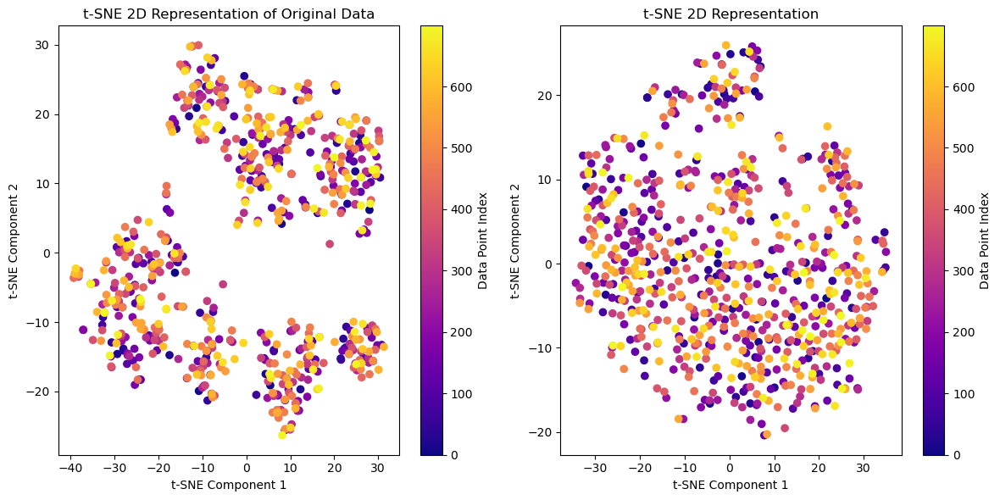

In [ ]:
tab.tsne_plot(enc_val,700)

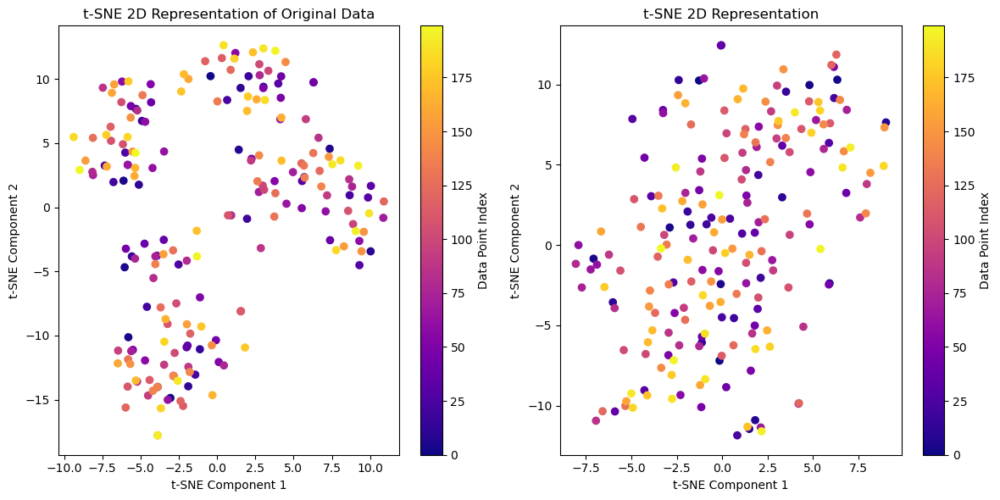

In [ ]:
tab.tsne_plot(enc_val,200)

In [ ]:
enc_val

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,ExterCond,Foundation,Heating,HeatingQC,CentralAir,KitchenQual,Functional,PavedDrive,SaleType,SaleCondition
0,0.410914,-0.877194,-1.126612,0.306983,0.768959,-0.301079,-0.883606,-0.308922,0.143636,0.537250,...,-0.176516,0.084534,-1.204882,0.064289,-0.698993,-0.787853,-0.488497,0.208109,1.245104,0.704716
1,1.794539,-1.307109,-0.322825,-0.135876,-1.363739,0.082141,0.291907,2.558491,-0.789788,-0.854295,...,0.831678,-0.360922,0.547935,0.815603,0.204323,-0.868493,-0.880580,-0.371768,-0.111582,-0.385938
2,1.143847,-0.529511,0.571827,0.356718,0.011977,0.740416,0.625111,-1.591340,-1.025984,1.194047,...,0.587023,-0.084620,-0.677779,-0.265832,-0.119444,-0.625011,-0.817902,-0.588056,1.988649,-0.231221
3,1.056411,-0.184097,-1.326420,0.298739,0.456967,-0.017448,1.099562,-1.516372,-0.220288,1.100691,...,0.090552,-0.125379,-0.248588,0.183860,-0.330187,-0.928923,-1.090298,0.662171,1.833809,-0.115450
4,1.283946,-0.406044,-1.493284,-0.465833,0.232276,0.507233,-0.829651,1.090214,-0.691227,-0.706497,...,0.556505,-0.480722,-0.814395,1.004478,-0.037906,-1.607958,-0.588070,-0.374376,0.792992,0.685971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,1.644560,-1.107434,0.347894,-0.343013,-1.065149,0.002688,0.714355,2.298538,0.174749,-1.438444,...,-0.350877,-0.586156,-0.397657,1.488835,0.273579,-0.909461,-0.627007,0.114487,-0.113327,-0.061239
2915,1.525835,-1.501935,-0.827115,0.166204,-1.171654,0.803959,0.813584,1.830181,0.673114,-1.474303,...,-1.024291,-0.769266,0.326426,1.878771,0.068974,-0.579596,-0.574693,-0.033394,0.297706,-0.475664
2916,0.720384,-0.523723,-0.101681,-0.041195,-0.593605,0.163509,0.077632,0.443453,-0.080987,0.428064,...,0.181570,-0.434543,-0.100801,1.603806,0.596154,-0.799820,-1.693148,0.458115,0.238408,-1.322792
2917,1.976177,-1.820557,0.180681,0.125864,0.342528,0.604681,-0.137669,0.059988,-0.360229,0.029507,...,0.523254,0.245774,-1.325588,0.710625,-0.003893,-0.901687,-1.274260,0.165171,0.684897,-0.144817


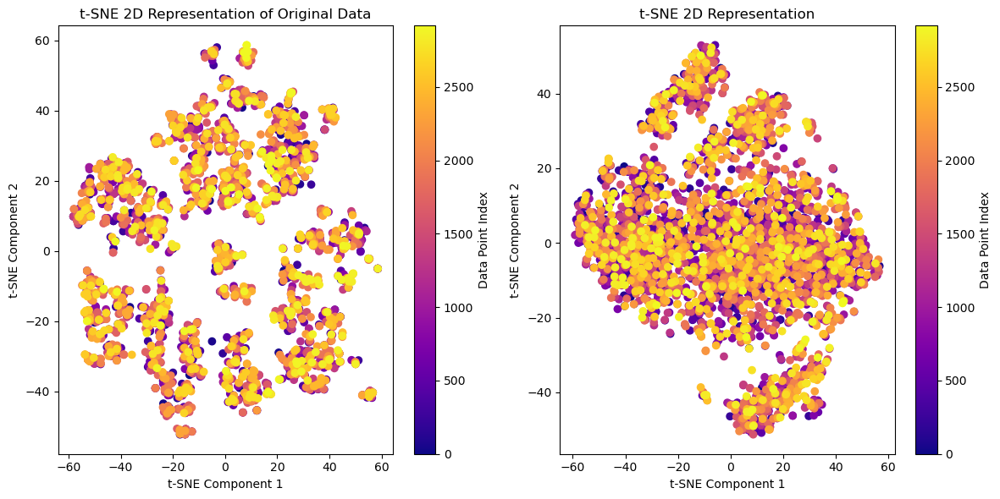

In [ ]:
tab.tsne_plot(enc_val,-1)

In [ ]:
scale = Scaling.z_score_scaling
train, test = tab.preprocess(scaling = scale,encoded_values=enc_val)

MSZoning       0
Street         0
LotShape       0
LandContour    0
Utilities      0
              ..
MoSold         0
YrSold         0
TotalSF        0
TotalBath      0
Age            0
Length: 63, dtype: int64


In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [ ]:
target

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [ ]:
train

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,TotalBath,Age
0,0.410914,-0.877194,-1.126612,0.306983,0.768959,-0.301079,-0.883606,-0.308922,0.143636,0.537250,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,0.157619,0.022309,1.657307,-1.037703
1,1.794539,-1.307109,-0.322825,-0.135876,-1.363739,0.082141,0.291907,2.558491,-0.789788,-0.854295,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-0.446848,-0.602858,-0.029886,0.595509,-0.180641
2,1.143847,-0.529511,0.571827,0.356718,0.011977,0.740416,0.625111,-1.591340,-1.025984,1.194047,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,1.026577,0.157619,0.196291,1.657307,-0.971776
3,1.056411,-0.184097,-1.326420,0.298739,0.456967,-0.017448,1.099562,-1.516372,-0.220288,1.100691,...,3.874303,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,-1.363335,-0.093265,-0.466288,1.797195
4,1.283946,-0.406044,-1.493284,-0.465833,0.232276,0.507233,-0.829651,1.090214,-0.691227,-0.706497,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,2.131647,0.157619,0.987913,1.657307,-0.938812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.701258,-0.893443,-0.277919,-0.769546,0.694607,0.521375,-0.378620,-0.053478,0.708663,-0.085261,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,0.658221,-0.602858,0.064562,0.595509,-0.938812
1456,0.985112,-0.857546,-1.203494,-0.296203,0.750736,0.019088,-0.073372,2.106735,-0.210044,-0.708783,...,-0.359539,-0.103313,-0.285886,-0.063139,-0.089577,-1.551918,1.678572,1.325936,0.595509,-0.147677
1457,1.060070,-0.463597,0.098737,0.795645,-0.333720,-1.081641,0.921338,0.698117,1.436587,0.543034,...,-0.359539,-0.103313,-0.285886,-0.063139,4.316469,-0.446848,1.678572,1.173080,-0.466288,1.071989
1458,1.391691,-0.941519,-0.875464,-0.720382,-0.516124,0.747820,-1.494947,1.376618,-0.831850,-0.749193,...,1.383808,-0.103313,-0.285886,-0.063139,-0.089577,-0.815205,1.678572,-0.487212,-0.466288,0.775313


In [ ]:
from sklearn.ensemble import RandomForestRegressor, IsolationForest
rfr = RandomForestRegressor()
IS = IsolationForest()

In [ ]:
run = run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.814905212778336
mean squared error:  1078826422.0616705
rmse:  40407.16598934581
----------
Model Performance For Test Set
----------
r2_score:  0.7890937470344075
mean squared error:  1632739063.2905447
rmse:  40407.16598934581
----------
LinearRegression()
__________


In [ ]:
np.log(run.get("rmse"))

10.60676242445756

In [ ]:
run = run_model(rfr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.9766683861796582
mean squared error:  135988494.5251333
rmse:  33403.86130772703
----------
Model Performance For Test Set
----------
r2_score:  0.8558661404180273
mean squared error:  1115817950.2658627
rmse:  33403.86130772703
----------
RandomForestRegressor()
__________


In [ ]:
run_model(IS,train,target)

Model Performance For Traning Set
----------
r2_score:  -5.610452808948188
mean squared error:  38529076151.369865
rmse:  201416.17909907643
----------
Model Performance For Test Set
----------
r2_score:  -4.240363085411812
mean squared error:  40568477202.87123
rmse:  201416.17909907643
----------
IsolationForest()
__________


{'Model Name': 'IsolationForest()',
 'r2_score': -4.2404,
 'mean squared error': 40568477202.8712,
 'rmse': 201416.1791}

In [ ]:
run_model(lr,train,target)

Model Performance For Traning Set
----------
r2_score:  0.814905212778336
mean squared error:  1078826422.0616705
rmse:  40407.16598934581
----------
Model Performance For Test Set
----------
r2_score:  0.7890937470344075
mean squared error:  1632739063.2905447
rmse:  40407.16598934581
----------
LinearRegression()
__________


{'Model Name': 'LinearRegression()',
 'r2_score': 0.7891,
 'mean squared error': 1632739063.2905,
 'rmse': 40407.166}

### Others

In [300]:
# Define custom dataset class
class AnyDataset(Dataset):
    def __init__(self, cat_features, labels, tokenizer, max_length):
    #     self.num_features = num_features
        self.cat_features = cat_features
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.cat_features)

    def __getitem__(self, idx):
        text = ' '.join([str(feature) for feature in self.cat_features[idx]])
        label = self.labels[idx]

        inputs = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )

        return {
            'input_ids': inputs['input_ids'].squeeze(0),
            'attention_mask': inputs['attention_mask'].squeeze(0),
            'label': torch.tensor(label, dtype=torch.long)
        }



NameError: name 'Dataset' is not defined

In [ ]:
from torch.utils.data import Dataset, DataLoader
from transformers import BertModel, BertTokenizer

In [ ]:
# Load pre-trained BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)


In [ ]:
def hyperparameter(train,MAX_LENGTH=128,BATCH_SIZE=32,num_epochs=5,label=None):
    """Initializing the Hyperparameters and Running the model

      parameters = dataset,
                    MAX_LENGTH,
                    BATCH_SIZE,
                    num_epochs,
                    label
                    """

    X_train, X_val, y_train, y_val = train_test_split(train,target,test_size=0.25,random_state=24)

    # Create custom datasets and data loaders
    train_dataset = AnyDataset(X_train, y_train, tokenizer, MAX_LENGTH)
    val_dataset = AnyDataset(X_val, y_val, tokenizer, MAX_LENGTH)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    # Fine-tune BERT model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.train()

    optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)
    # print(next(iter(train_dataset)))

    torch.manual_seed(42)
    for epoch in range(num_epochs):
      for batch in train_loader:
          input_ids = batch['input_ids'].to(device)
          attention_mask = batch['attention_mask'].to(device)
          labels = batch['label'].to(device)

          outputs = model(input_ids, attention_mask=attention_mask)
          logits = outputs.last_hidden_state[:, 0, :]  # Get the CLS token representation
          # predictions = torch.argmax(logits, dim=1)
          prediction = outputs.Softmax(logits,dim=27)

          loss = torch.nn.L1Loss()(logits, labels)

          optimizer.zero_grad()
          loss.backward()
          optimizer.step()

      print(f"Loss: {loss}")

      # Evaluate model on validation set
      model.eval()
      val_predictions = []
      val_labels = []

      for batch in val_loader:
          with torch.no_grad():
              input_ids = batch['input_ids'].to(device)
              attention_mask = batch['attention_mask'].to(device)
              labels = batch['label'].to(device)

              outputs = model(input_ids, attention_mask=attention_mask)
              logits = outputs.last_hidden_state[:, 0, :]
              # predictions = torch.argmax(logits, dim=1)
              predictions = outputs.Softmax(logits,dim=27)

              val_predictions.extend(predictions.cpu().numpy())
              val_labels.extend(labels.cpu().numpy())

      # Calculate accuracy
      # accuracy = log(val_labels, val_predictions)/
      # print(f'Validation Accuracy: {accuracy}')

    return {"model_name": model.__class__.__name__,
            "model_loss": loss.item(),
            # "model_acc": accuracy,
            'token_length':MAX_LENGTH,
            'batch_size':BATCH_SIZE}

In [ ]:
hyperparameter(train_df,len(cat_col),label="SalePrice")